In [ ]:
!pip install networkx
!pip install matplotlib
!pip install ipywidgets
!pip install random
!pip install IPython.display

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 25.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement random (from versions: none)
ERROR: No matching distribution found for random
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement IPython.display (from versions: none)
ERROR: No matching distribution found for IPython.display


#Clustering Coefficients

The clustering coefficient measures the extent to which nodes in a graph tend to form clusters or groups. It quantifies the presence of local clustering or the likelihood that the neighbors of a node are also connected to each other.

In a graph, the clustering coefficient of a node is calculated as the ratio of the number of edges between the node's neighbors to the total possible number of edges between them.

To compute the clustering coefficient of a graph we take the average clustering for each node in the graph.



IntText(value=10, description='Number of Nodes 1:')

FloatSlider(value=0.3, description='Clustering Coefficient 1:', max=1.0, step=0.01)

IntText(value=10, description='Number of Nodes 2:')

FloatSlider(value=0.5, description='Clustering Coefficient 2:', max=1.0, step=0.01)

IntText(value=10, description='Number of Nodes 3:')

FloatSlider(value=0.7, description='Clustering Coefficient 3:', max=1.0, step=0.01)

Button(description='Refresh', style=ButtonStyle())

<Figure size 640x480 with 0 Axes>

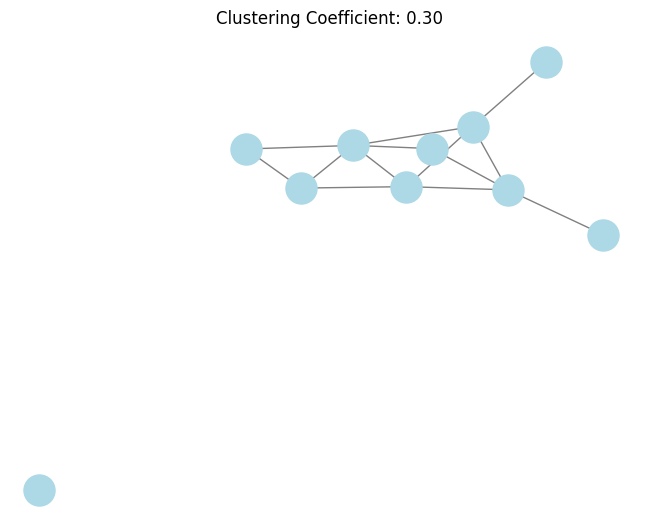

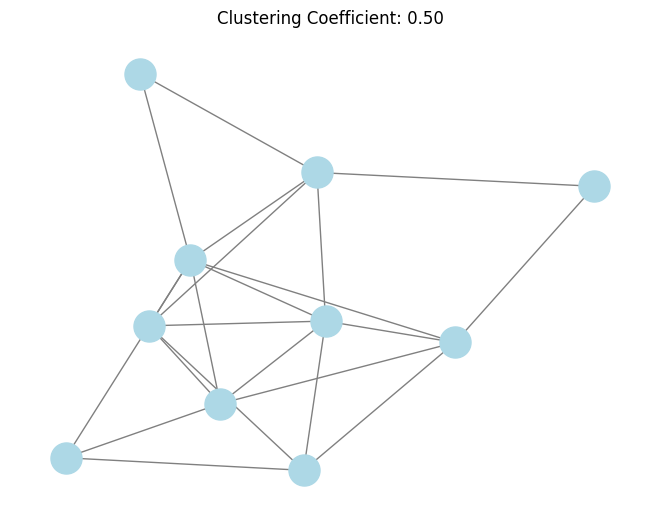

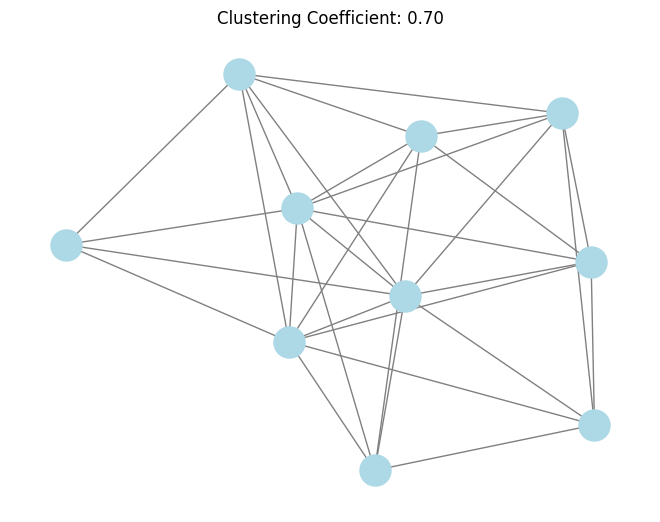

<Figure size 640x480 with 0 Axes>

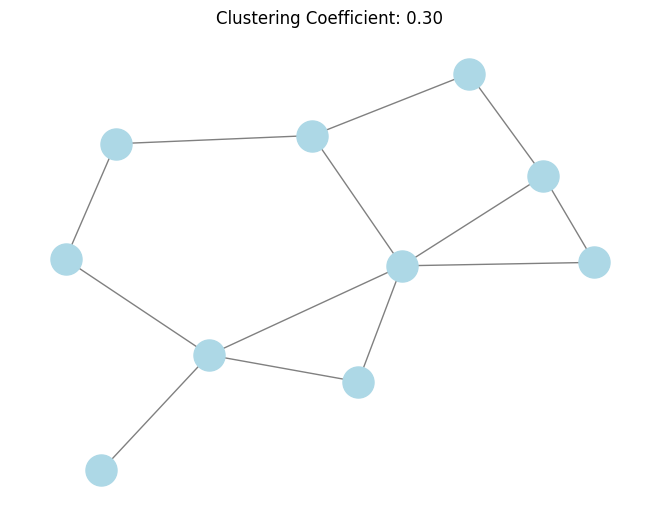

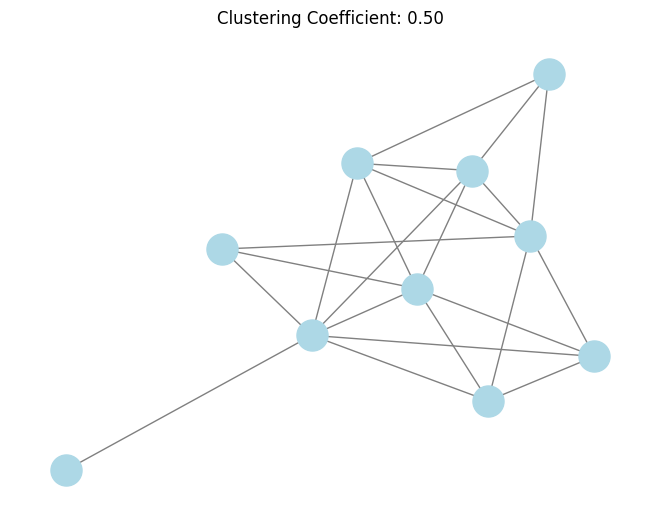

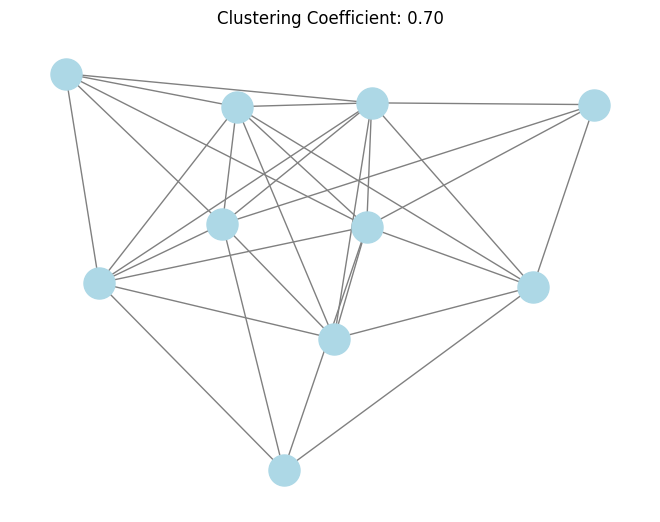

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

def generate_random_graph_with_clustering_coefficient(num_nodes, clustering_coefficient):
    # Create an empty graph
    graph = nx.Graph()

    # Add nodes to the graph
    graph.add_nodes_from(range(num_nodes))

    # Calculate the desired number of edges
    target_edges = int(clustering_coefficient * (num_nodes * (num_nodes - 1)) / 2)

    # Add edges to the graph randomly until the desired number of edges is reached
    while graph.number_of_edges() < target_edges:
        node1 = random.randint(0, num_nodes - 1)
        node2 = random.randint(0, num_nodes - 1)
        if node1 != node2 and not graph.has_edge(node1, node2):
            graph.add_edge(node1, node2)

    return graph

def visualize_graph(graph, clustering_coefficient):
    plt.figure()
    nx.draw(graph, with_labels=False, node_color='lightblue', edge_color='gray', node_size=500, font_size=10)
    plt.title(f"Clustering Coefficient: {clustering_coefficient:.2f}")
    plt.show()

def refresh_graphs(button):
    # Retrieve the values from the input fields and sliders
    num_nodes1 = int(input_field1.value)
    clustering_coefficient1 = slider1.value
    num_nodes2 = int(input_field2.value)
    clustering_coefficient2 = slider2.value
    num_nodes3 = int(input_field3.value)
    clustering_coefficient3 = slider3.value

    # Generate random graphs based on the input values
    random_graph1 = generate_random_graph_with_clustering_coefficient(num_nodes1, clustering_coefficient1)
    random_graph2 = generate_random_graph_with_clustering_coefficient(num_nodes2, clustering_coefficient2)
    random_graph3 = generate_random_graph_with_clustering_coefficient(num_nodes3, clustering_coefficient3)

    # Clear the previous graphs
    plt.clf()

    # Visualize the graphs
    visualize_graph(random_graph1, clustering_coefficient1)
    visualize_graph(random_graph2, clustering_coefficient2)
    visualize_graph(random_graph3, clustering_coefficient3)

# Create input fields for specifying the number of nodes
input_field1 = widgets.IntText(description='Number of Nodes 1:', value=10)
input_field2 = widgets.IntText(description='Number of Nodes 2:', value=10)
input_field3 = widgets.IntText(description='Number of Nodes 3:', value=10)

# Create sliders for inputting the clustering coefficients
slider1 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Clustering Coefficient 1:', value=0.3)
slider2 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Clustering Coefficient 2:', value=0.5)
slider3 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Clustering Coefficient 3:', value=0.7)

# Create a refresh button
refresh_button = widgets.Button(description='Refresh')
refresh_button.on_click(refresh_graphs)

# Display the widgets
display(input_field1, slider1, input_field2, slider2, input_field3, slider3, refresh_button)

# Generate and display the initial graphs
random_graph1 = generate_random_graph_with_clustering_coefficient(input_field1.value, slider1.value)
random_graph2 = generate_random_graph_with_clustering_coefficient(input_field2.value, slider2.value)
random_graph3 = generate_random_graph_with_clustering_coefficient(input_field3.value, slider3.value)

# Clear the previous graphs
plt.clf()

# Visualize the graphs
visualize_graph(random_graph1, slider1.value)
visualize_graph(random_graph2, slider2.value)
visualize_graph(random_graph3, slider3.value)


#Small worldedness

In the context of the given code, small-worldedness refers to the property of a graph where most nodes are connected to their nearby neighbors, forming clusters or local communities, while a few connections exist that allow for long-range shortcuts between different clusters.

Small-worldness is typically measured using the clustering coefficient and the average shortest path length of a network. The small-worldness coefficient (σ) is calculated as the ratio of the clustering coefficient (C) to the average shortest path length (L) of the network, normalized by the corresponding values of a random network with the same number of nodes and edges.


The following code allows you to generate graphs with varying degrees of small-worldedness adjusting the small-world coefficient.



IntText(value=10, description='Number of Nodes 1:')

FloatSlider(value=0.3, description='Small-World Coefficient 1:', max=1.0, step=0.01)

IntText(value=10, description='Number of Nodes 2:')

FloatSlider(value=0.5, description='Small-World Coefficient 2:', max=1.0, step=0.01)

IntText(value=10, description='Number of Nodes 3:')

FloatSlider(value=0.7, description='Small-World Coefficient 3:', max=1.0, step=0.01)

Button(description='Refresh', style=ButtonStyle())

<Figure size 640x480 with 0 Axes>

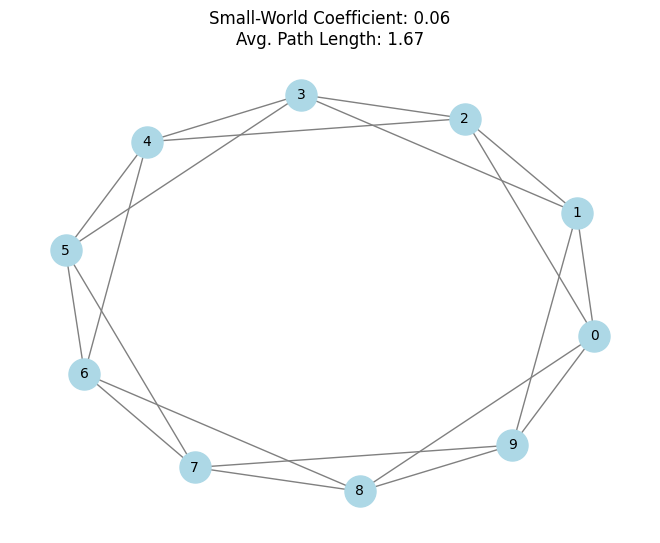

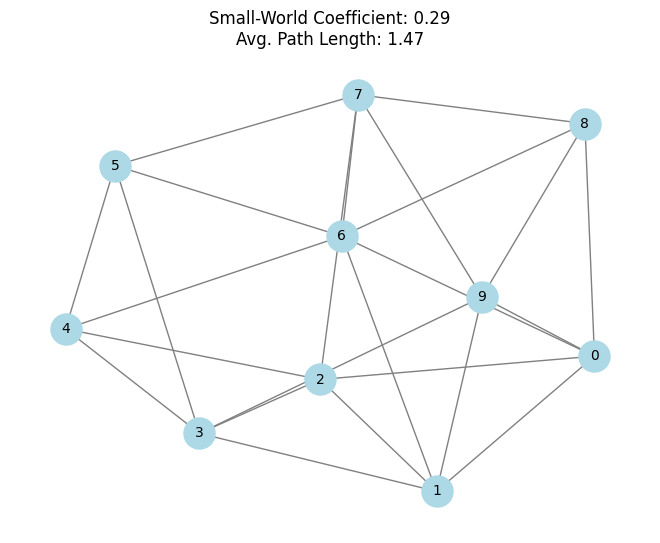

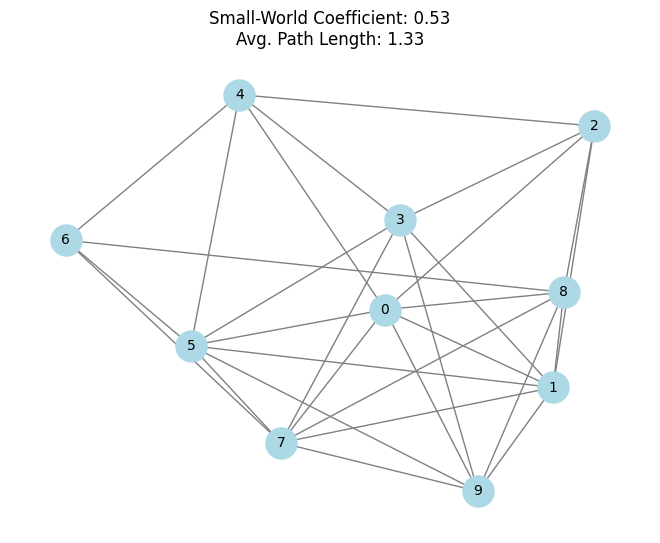

<Figure size 640x480 with 0 Axes>

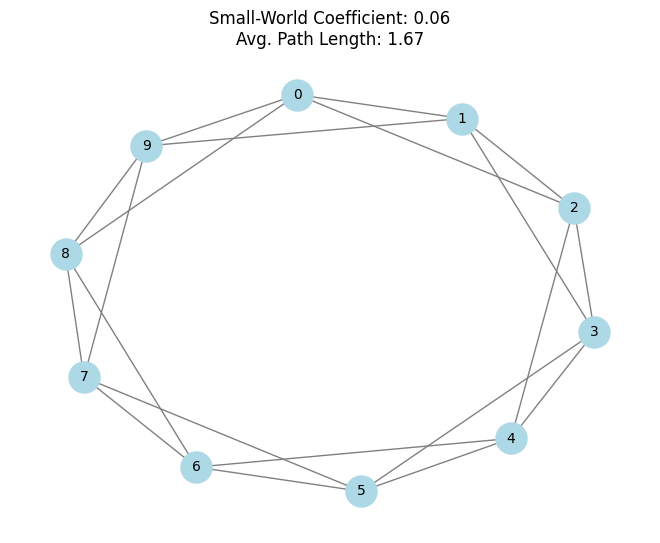

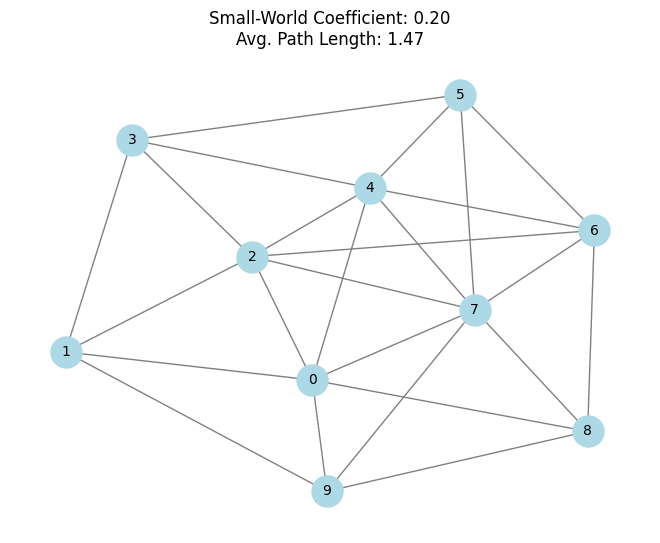

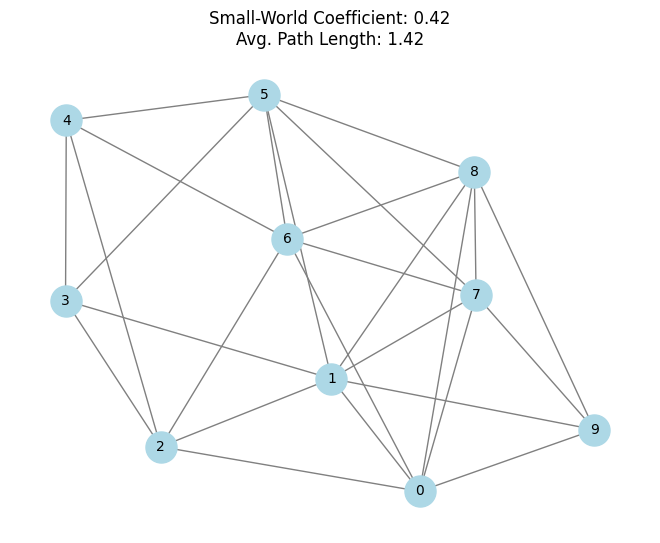

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

def generate_small_world_graph(num_nodes, p, target_avg_path_length):
    # Generate a small-world graph
    graph = nx.newman_watts_strogatz_graph(num_nodes, int(num_nodes/2), p)

    # Continue rewiring until the average path length reaches the target value
    while nx.average_shortest_path_length(graph) > target_avg_path_length:
        edges = list(graph.edges)
        random.shuffle(edges)
        for u, v in edges:
            if random.random() < p:
                w = random.choice(list(graph.nodes))
                if u != w and not graph.has_edge(u, w):
                    graph.remove_edge(u, v)
                    graph.add_edge(u, w)

    return graph

def visualize_graph(graph, small_world_coefficient, avg_path_length):
    plt.figure()
    nx.draw(graph, with_labels=True, node_color='lightblue', edge_color='gray', node_size=500, font_size=10)
    plt.title(f"Small-World Coefficient: {small_world_coefficient:.2f}\nAvg. Path Length: {avg_path_length:.2f}")
    plt.show()

def refresh_graphs(button):
    # Retrieve the values from the input fields and sliders
    num_nodes1 = int(input_field1.value)
    small_world_coefficient1 = slider1.value
    num_nodes2 = int(input_field2.value)
    small_world_coefficient2 = slider2.value
    num_nodes3 = int(input_field3.value)
    small_world_coefficient3 = slider3.value

    # Generate small-world graphs based on the input values
    target_avg_path_length = 2  # Adjust this value as desired
    random_graph1 = generate_small_world_graph(num_nodes1, small_world_coefficient1, target_avg_path_length)
    random_graph2 = generate_small_world_graph(num_nodes2, small_world_coefficient2, target_avg_path_length)
    random_graph3 = generate_small_world_graph(num_nodes3, small_world_coefficient3, target_avg_path_length)

    # Clear the previous graphs
    plt.clf()

    # Calculate the average path length for the generated graphs
    avg_path_length1 = nx.average_shortest_path_length(random_graph1)
    avg_path_length2 = nx.average_shortest_path_length(random_graph2)
    avg_path_length3 = nx.average_shortest_path_length(random_graph3)

    # Visualize the graphs
    visualize_graph(random_graph1, small_world_coefficient1, avg_path_length1)
    visualize_graph(random_graph2, small_world_coefficient2, avg_path_length2)
    visualize_graph(random_graph3, small_world_coefficient3, avg_path_length3)

# Create input fields for specifying the number of nodes
input_field1 = widgets.IntText(description='Number of Nodes 1:', value=10)
input_field2 = widgets.IntText(description='Number of Nodes 2:', value=10)
input_field3 = widgets.IntText(description='Number of Nodes 3:', value=10)

# Create sliders for inputting the small-world coefficients
slider1 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Small-World Coefficient 1:', value=0.3)
slider2 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Small-World Coefficient 2:', value=0.5)
slider3 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Small-World Coefficient 3:', value=0.7)

# Create a refresh button
refresh_button = widgets.Button(description='Refresh')
refresh_button.on_click(refresh_graphs)

# Display the widgets
display(input_field1, slider1, input_field2, slider2, input_field3, slider3, refresh_button)



#The Newman-Watts-Strogatz method of creating a small world network

In the Newman-Watts-Strogatz method of generating small worldedness we start with a regular lattice where all nodes are connected to their nearest neighbours, and edges are rewired are then rewired with a certain probability p.

The rewiring process in the Watts-Strogatz model is random, allowing any edge in the initial regular lattice to be rewired. There are no constraints or preferences for selecting edges to rewire other than the given rewiring probability. This randomness in rewiring helps introduce the long-range connections necessary for achieving small-world properties.

However, in a completely random network, where p is equal to 1, the clustering coefficient is low, indicating a lack of local clustering. As a result, the average path length in a random network is relatively long and small worldedness is low.

In the Newman-Watts-Strogatz model, as the rewiring probability p increases, the network transitions from a regular lattice to a small-world network and eventually to a random network. The small-worldness, measured by the small-world coefficient, typically peaks around p = 0.1 to p = 0.3 and then decreases as p approaches 1.



IntText(value=4, description='Initial Connections:')

IntText(value=10, description='Number of Nodes 1:')

FloatSlider(value=0.3, description='Rewiring Probability 1:', max=1.0, step=0.01)

IntText(value=10, description='Number of Nodes 2:')

FloatSlider(value=0.5, description='Rewiring Probability 2:', max=1.0, step=0.01)

IntText(value=10, description='Number of Nodes 3:')

FloatSlider(value=0.7, description='Rewiring Probability 3:', max=1.0, step=0.01)

Button(description='Refresh', style=ButtonStyle())

<Figure size 640x480 with 0 Axes>

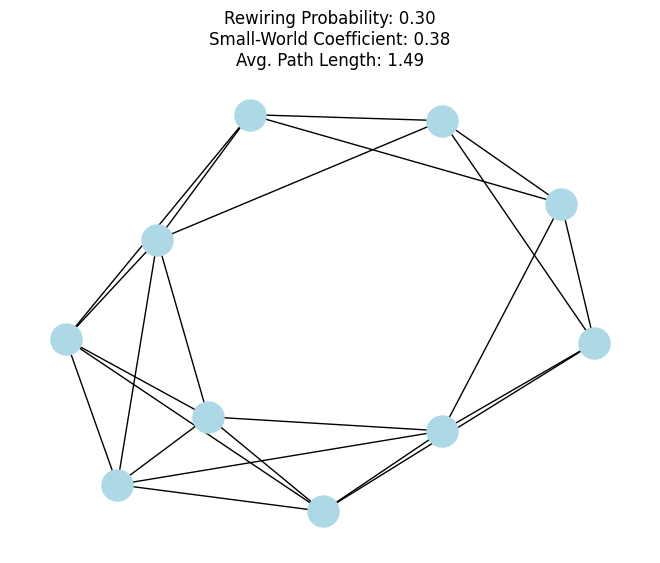

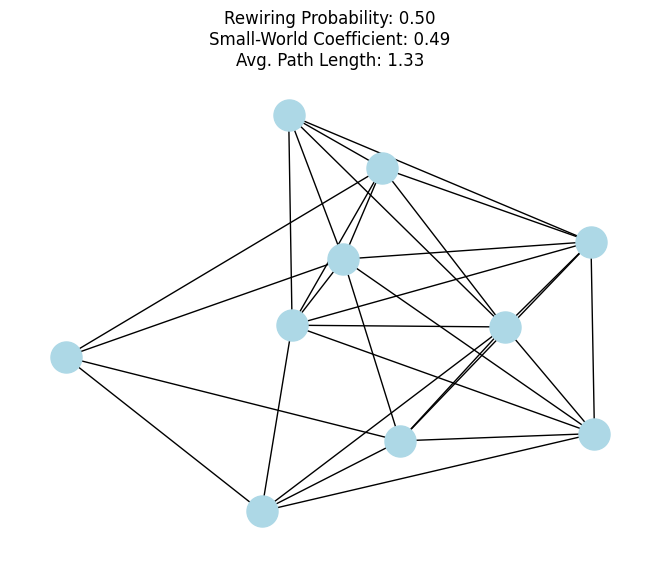

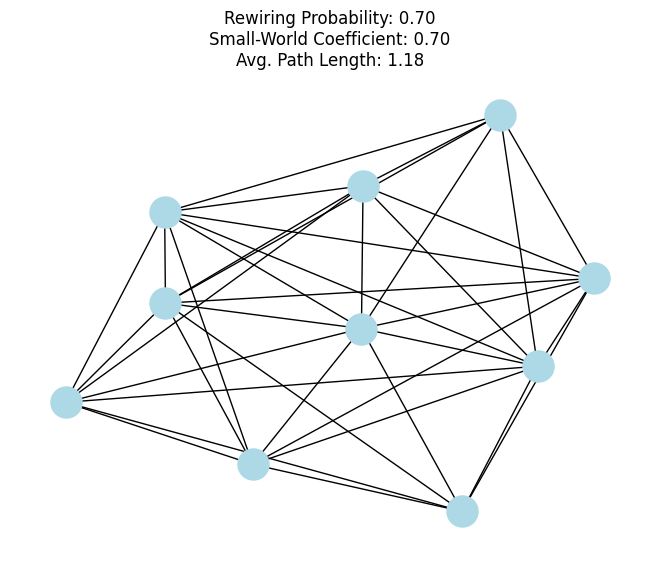

<Figure size 640x480 with 0 Axes>

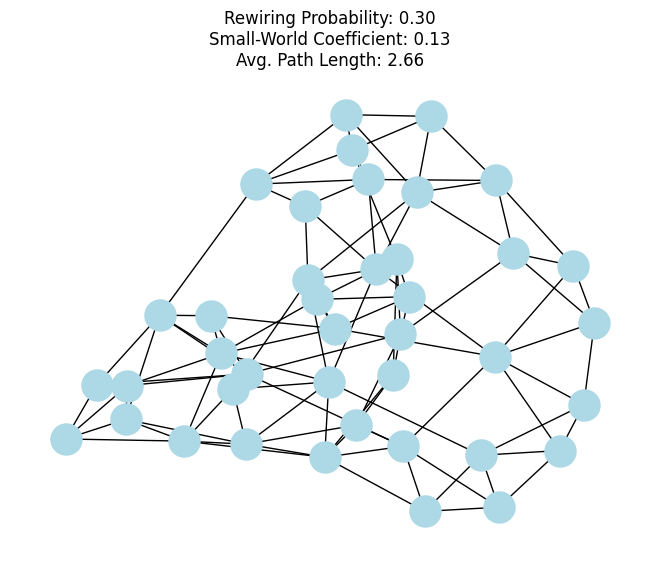

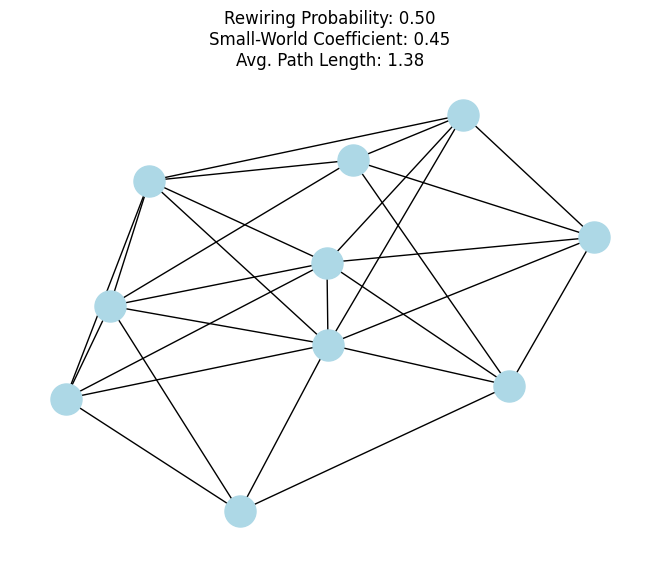

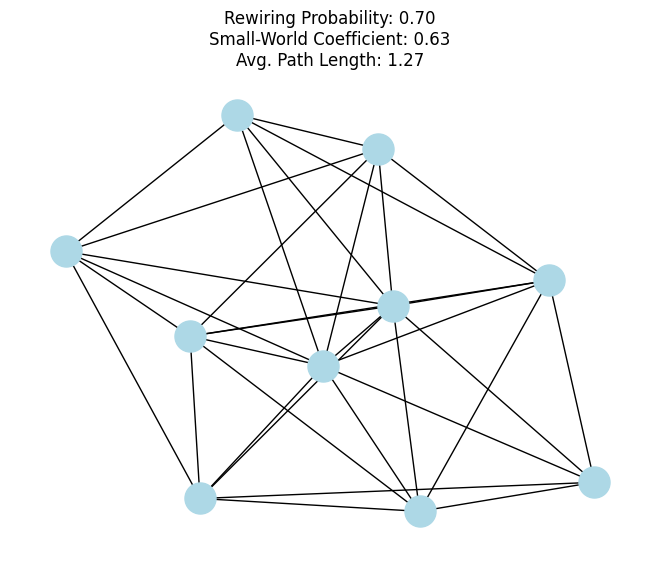

<Figure size 640x480 with 0 Axes>

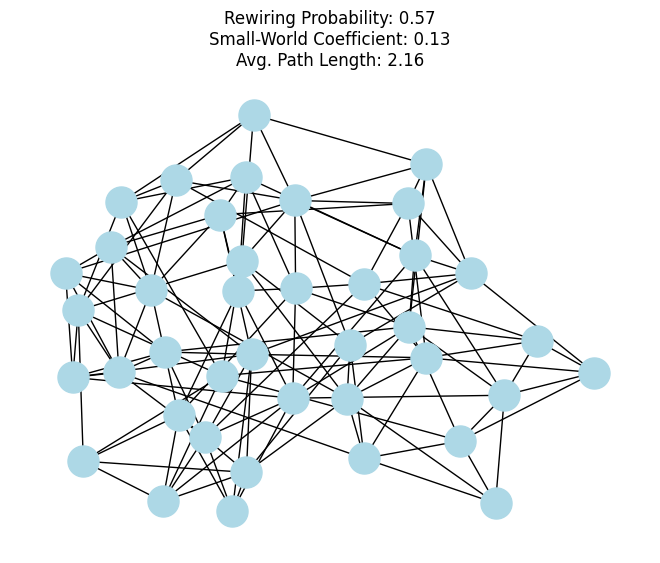

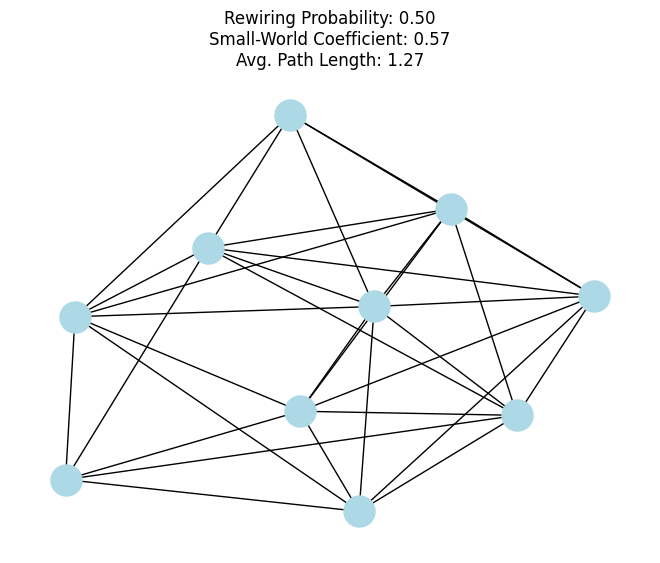

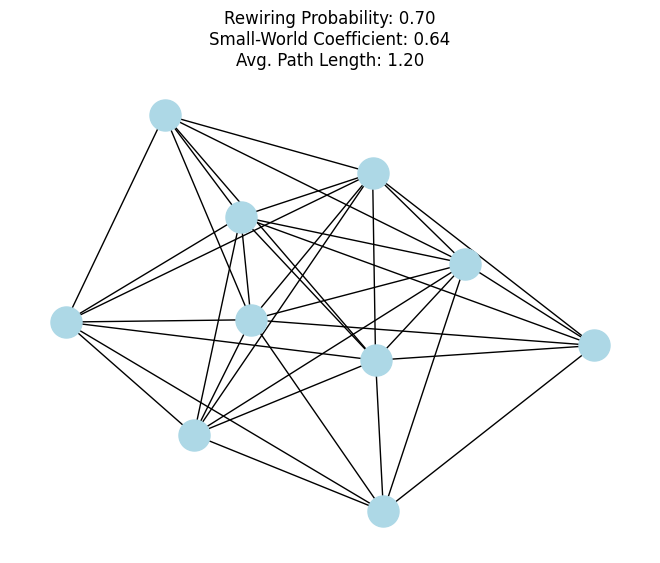

<Figure size 640x480 with 0 Axes>

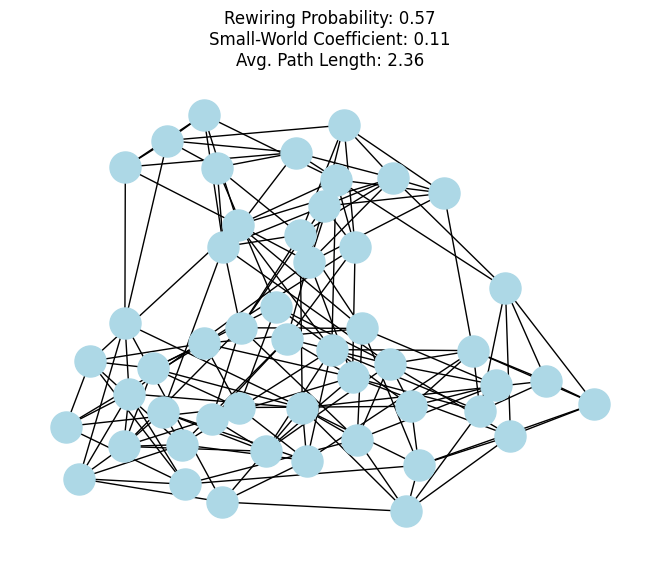

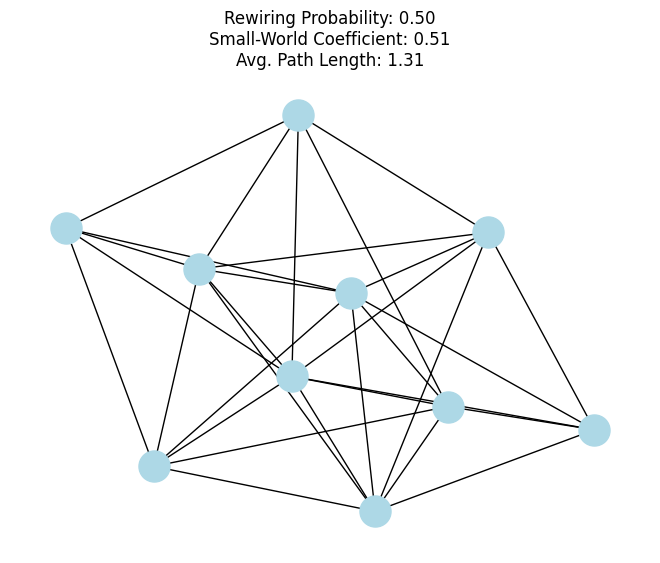

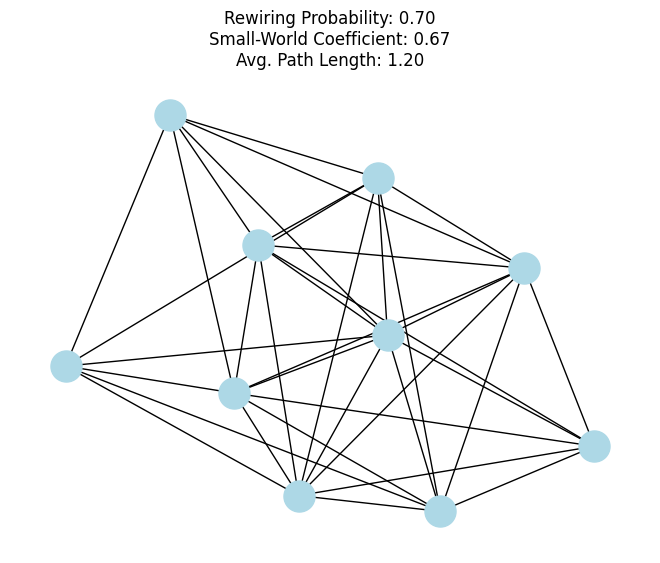

<Figure size 640x480 with 0 Axes>

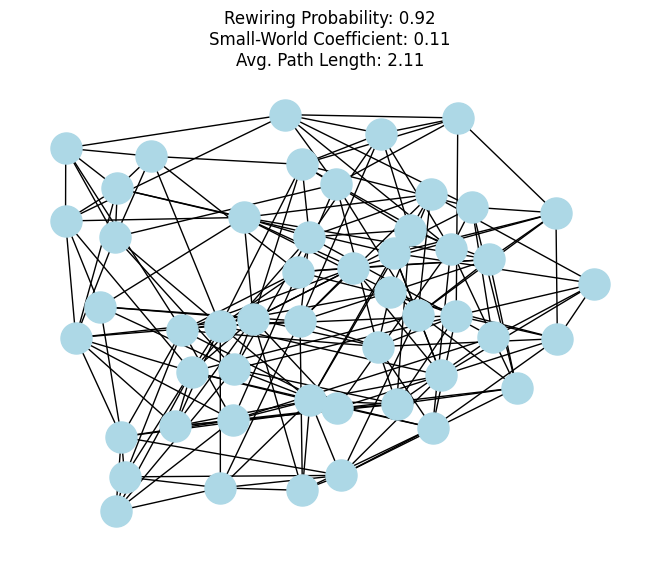

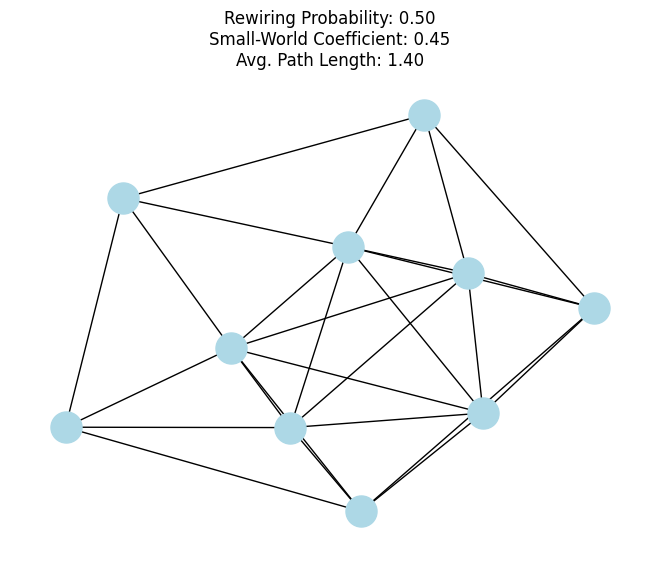

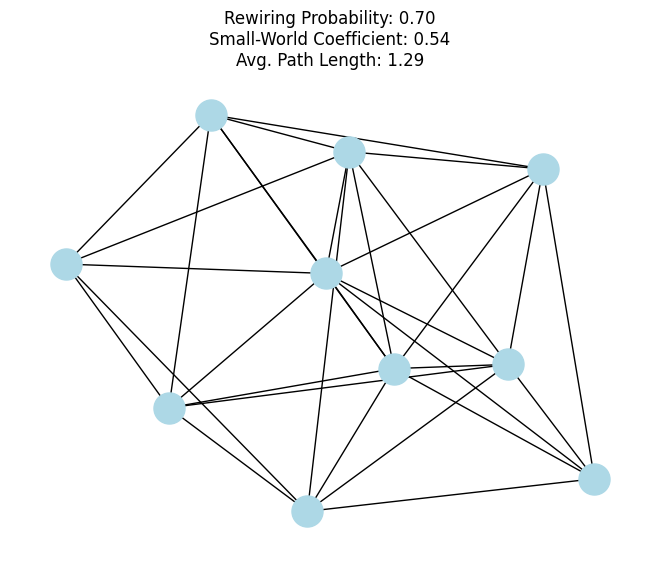

<Figure size 640x480 with 0 Axes>

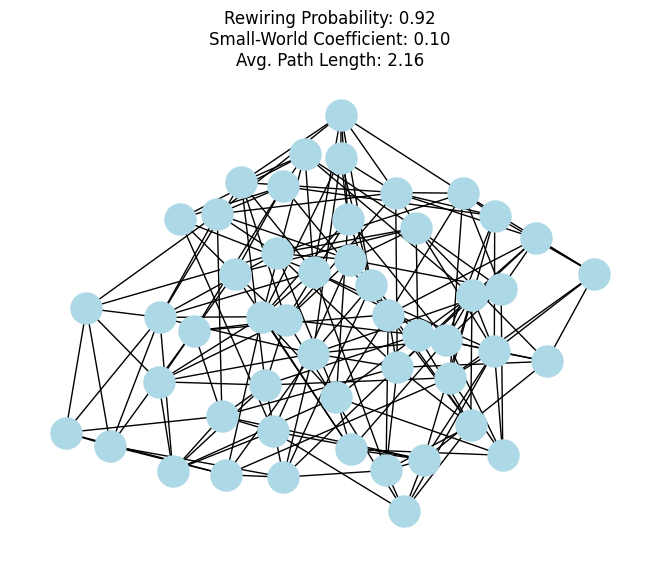

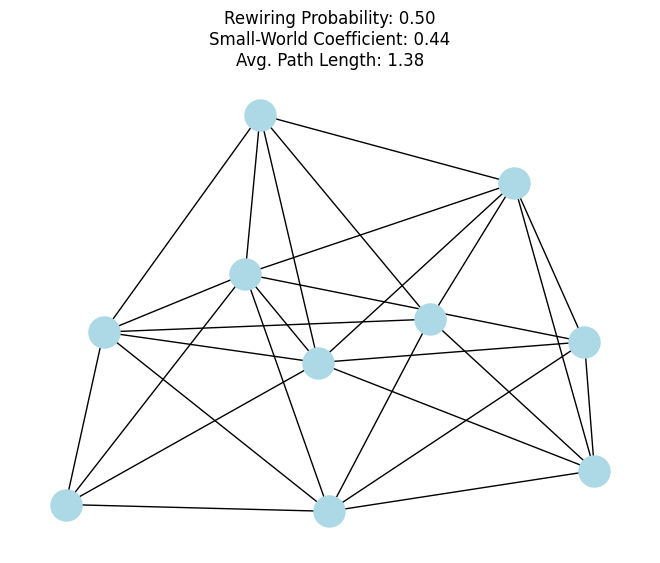

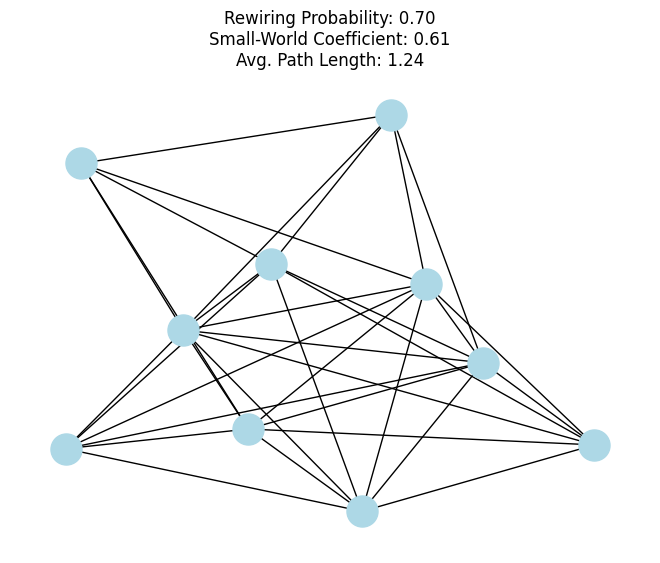

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

def generate_small_world_graph(num_nodes, initial_connections, p):
    # Generate a small-world graph
    graph = nx.newman_watts_strogatz_graph(num_nodes, initial_connections, p)
    return graph

def visualize_graph(graph, rewiring_probability, small_world_coefficient, avg_path_length):
    plt.figure()
    nx.draw(graph, with_labels=False, node_color='lightblue', edge_color='black', node_size=500, font_size=10)
    plt.title(f"Rewiring Probability: {rewiring_probability:.2f}\nSmall-World Coefficient: {small_world_coefficient:.2f}\nAvg. Path Length: {avg_path_length:.2f}")
    plt.show()

def refresh_graphs(button):
    # Retrieve the values from the input fields and sliders
    initial_connections = int(input_field0.value)
    num_nodes1 = int(input_field1.value)
    rewiring_probability1 = slider1.value
    num_nodes2 = int(input_field2.value)
    rewiring_probability2 = slider2.value
    num_nodes3 = int(input_field3.value)
    rewiring_probability3 = slider3.value

    # Generate small-world graphs based on the input values
    random_graph1 = generate_small_world_graph(num_nodes1, initial_connections, rewiring_probability1)
    random_graph2 = generate_small_world_graph(num_nodes2, initial_connections, rewiring_probability2)
    random_graph3 = generate_small_world_graph(num_nodes3, initial_connections, rewiring_probability3)

    # Clear the previous graphs
    plt.clf()

    # Calculate the largest connected components
    largest_connected_comp1 = max(nx.connected_components(random_graph1), key=len)
    largest_connected_comp2 = max(nx.connected_components(random_graph2), key=len)
    largest_connected_comp3 = max(nx.connected_components(random_graph3), key=len)

    # Calculate the small-world coefficients for the largest connected components
    small_world_coefficient1 = nx.average_clustering(random_graph1.subgraph(largest_connected_comp1)) / nx.average_shortest_path_length(random_graph1.subgraph(largest_connected_comp1), weight=None)
    small_world_coefficient2 = nx.average_clustering(random_graph2.subgraph(largest_connected_comp2)) / nx.average_shortest_path_length(random_graph2.subgraph(largest_connected_comp2), weight=None)
    small_world_coefficient3 = nx.average_clustering(random_graph3.subgraph(largest_connected_comp3)) / nx.average_shortest_path_length(random_graph3.subgraph(largest_connected_comp3), weight=None)

    # Calculate the average path length for the largest connected components
    avg_path_length1 = nx.average_shortest_path_length(random_graph1.subgraph(largest_connected_comp1), weight=None)
    avg_path_length2 = nx.average_shortest_path_length(random_graph2.subgraph(largest_connected_comp2), weight=None)
    avg_path_length3 = nx.average_shortest_path_length(random_graph3.subgraph(largest_connected_comp3), weight=None)

    # Visualize the graphs
    visualize_graph(random_graph1.subgraph(largest_connected_comp1), slider1.value, small_world_coefficient1, avg_path_length1)
    visualize_graph(random_graph2.subgraph(largest_connected_comp2), slider2.value, small_world_coefficient2, avg_path_length2)
    visualize_graph(random_graph3.subgraph(largest_connected_comp3), slider3.value, small_world_coefficient3, avg_path_length3)


# Create input fields for specifying the number of nodes
input_field0 = widgets.IntText(description='Initial Connections:', value=4)
input_field1 = widgets.IntText(description='Number of Nodes 1:', value=10)
input_field2 = widgets.IntText(description='Number of Nodes 2:', value=10)
input_field3 = widgets.IntText(description='Number of Nodes 3:', value=10)

# Create sliders for inputting the rewiring probabilities
slider1 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Rewiring Probability 1:', value=0.3)
slider2 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Rewiring Probability 2:', value=0.5)
slider3 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Rewiring Probability 3:', value=0.7)

# Create a refresh button
refresh_button = widgets.Button(description='Refresh')
refresh_button.on_click(refresh_graphs)

# Display the widgets
display(input_field0, input_field1, slider1, input_field2, slider2, input_field3, slider3, refresh_button)



IntText(value=10, description='Number of Nodes 1:')

FloatSlider(value=0.3, description='Rewire Proability 1:', max=1.0, step=0.01)

FloatSlider(value=0.5, description='Sparsity 1:', max=1.0, step=0.01)

IntText(value=10, description='Number of Nodes 2:')

FloatSlider(value=0.5, description='Rewire Proability 2:', max=1.0, step=0.01)

FloatSlider(value=0.5, description='Sparsity 2:', max=1.0, step=0.01)

IntText(value=10, description='Number of Nodes 3:')

FloatSlider(value=0.7, description='Rewire Proability 3:', max=1.0, step=0.01)

FloatSlider(value=0.5, description='Sparsity 3:', max=1.0, step=0.01)

Button(description='Refresh', style=ButtonStyle())

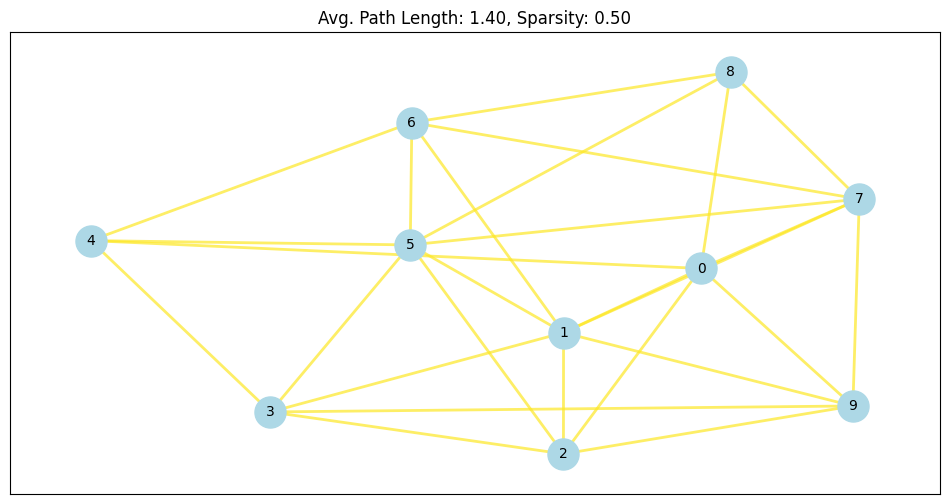

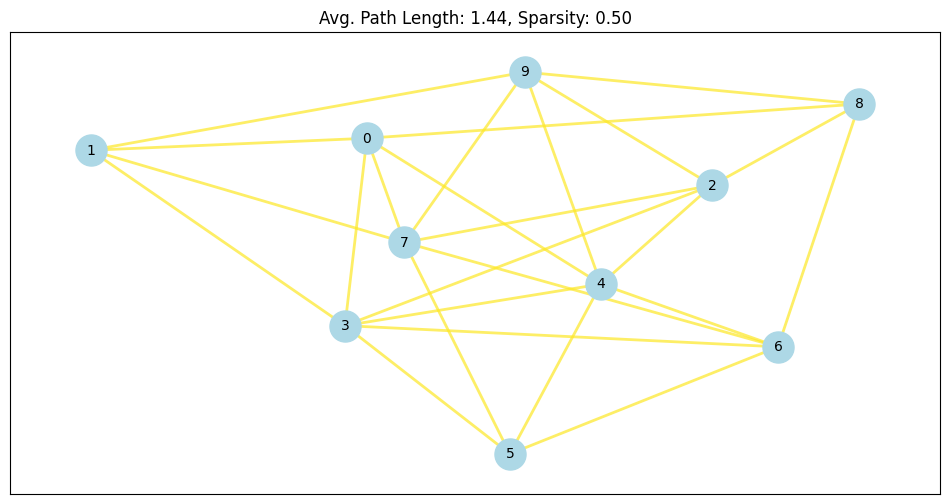

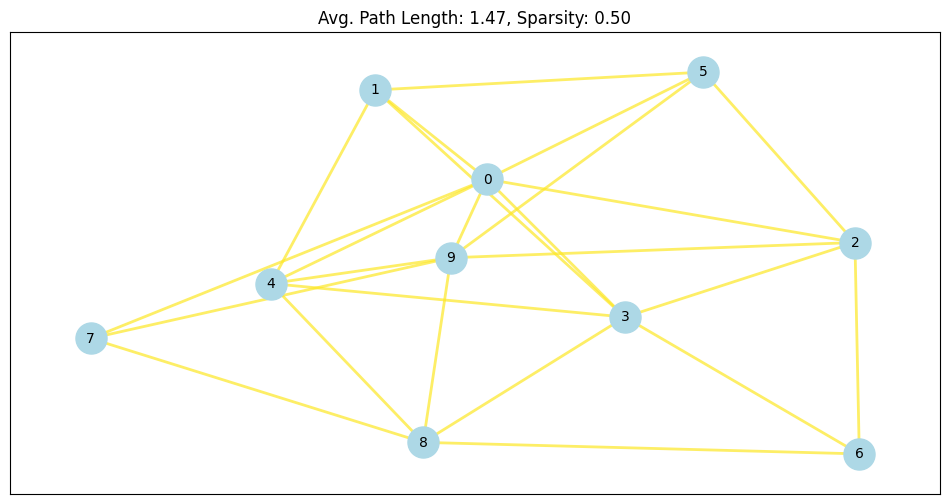

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

def generate_small_world_graph(num_nodes, p, target_avg_path_length, sparsity):
    # Generate a small-world graph
    graph = nx.watts_strogatz_graph(num_nodes, int(num_nodes/2), p)

    # Calculate the maximum number of edges for the desired sparsity
    max_edges = int(num_nodes * (num_nodes - 1) * sparsity / 2)

    # Adjust the number of edges based on sparsity while ensuring graph connectivity
    while graph.number_of_edges() > max_edges:
        edges = list(graph.edges())
        random.shuffle(edges)
        for u, v in edges:
            graph.remove_edge(u, v)
            if not nx.is_connected(graph):
                graph.add_edge(u, v)

    while graph.number_of_edges() < max_edges:
        nodes = list(graph.nodes())
        random.shuffle(nodes)
        for i in range(len(nodes) - 1):
            u = nodes[i]
            v = nodes[i + 1]
            graph.add_edge(u, v)
            if not nx.is_connected(graph):
                graph.remove_edge(u, v)

    # Reconnect disconnected components to their nearest neighbors
    components = list(nx.connected_components(graph))
    num_components = len(components)
    if num_components > 1:
        for i in range(1, num_components):
            component = list(components[i])
            node = random.choice(component)
            nearest_neighbors = nx.node_connected_component(graph, node)
            nearest_neighbor = random.choice(list(nearest_neighbors))
            graph.add_edge(node, nearest_neighbor)

    # Compute the path lengths for all pairs of nodes
    path_lengths = dict(nx.all_pairs_shortest_path_length(graph))

    # Assign path lengths to the edges
    for u, v in graph.edges():
        graph[u][v]['path_length'] = path_lengths[u][v]

    return graph







import numpy as np

def visualize_graph(graph, avg_path_length, sparsity):
    plt.figure(figsize=(12, 6))
    pos = nx.spring_layout(graph)
    nx.draw_networkx_nodes(graph, pos, node_color='lightblue', node_size=500)
    nx.draw_networkx_labels(graph, pos, font_size=10)

    # Compute the maximum path length for normalization
    max_path_length = max(graph[u][v]['path_length'] for u, v in graph.edges())

    # Normalize and clip the edge colors based on the maximum path length
    edge_colors = [graph[u][v]['path_length'] / max_path_length for u, v in graph.edges()]
    edge_colors = [max(min(color, 1), 0) for color in edge_colors]  # Clip values to range [0, 1]

    # Draw edges with colors based on path length
    edges = nx.draw_networkx_edges(
        graph, pos, edge_color=edge_colors, width=2, edge_vmin=0, edge_vmax=1, alpha=0.7
    )

    # Create a separate colorbar for the edge colors
    #sm = plt.cm.ScalarMappable(cmap=plt.cm.YlGnBu)
    #sm.set_array(edge_colors)
    #plt.colorbar(sm, label='Normalized Path Length')

    plt.title(f"Avg. Path Length: {avg_path_length:.2f}, Sparsity: {sparsity:.2f}")

    # Compute the path length frequency distribution
    #path_lengths = dict(nx.all_pairs_shortest_path_length(graph))
    #all_path_lengths = [length for lengths in path_lengths.values() for length in lengths.values()]
    #plt.figure(figsize=(8, 4))
    #plt.hist(all_path_lengths, bins=np.arange(max_path_length + 2), edgecolor='black')
    #plt.xlabel('Path Length')
    #plt.ylabel('Frequency')
    #plt.title('Path Length Frequency Distribution')

    plt.show()





def refresh_graphs(button):
    # Retrieve the values from the input fields and sliders
    num_nodes1 = int(input_field1.value)
    small_world_coefficient1 = slider1.value
    sparsity1 = slider_sparsity1.value
    num_nodes2 = int(input_field2.value)
    small_world_coefficient2 = slider2.value
    sparsity2 = slider_sparsity2.value
    num_nodes3 = int(input_field3.value)
    small_world_coefficient3 = slider3.value
    sparsity3 = slider_sparsity3.value

    # Generate small-world graphs based on the input values
    target_avg_path_length = 2  # Adjust this value as desired
    random_graph1 = generate_small_world_graph(num_nodes1, small_world_coefficient1, target_avg_path_length, sparsity1)
    random_graph2 = generate_small_world_graph(num_nodes2, small_world_coefficient2, target_avg_path_length, sparsity2)
    random_graph3 = generate_small_world_graph(num_nodes3, small_world_coefficient3, target_avg_path_length, sparsity3)

    # Clear the previous graphs
    plt.clf()

    # Visualize the graphs
    visualize_graph(random_graph1, nx.average_shortest_path_length(random_graph1), sparsity1)
    visualize_graph(random_graph2, nx.average_shortest_path_length(random_graph2), sparsity2)
    visualize_graph(random_graph3, nx.average_shortest_path_length(random_graph3), sparsity3)

# Create input fields for specifying the number of nodes
input_field1 = widgets.IntText(description='Number of Nodes 1:', value=10)
input_field2 = widgets.IntText(description='Number of Nodes 2:', value=10)
input_field3 = widgets.IntText(description='Number of Nodes 3:', value=10)

# Create sliders for inputting the small-world coefficients
slider1 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Rewire Proability 1:', value=0.3)
slider2 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Rewire Proability 2:', value=0.5)
slider3 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Rewire Proability 3:', value=0.7)

# Create a slider for controlling the sparsity
slider_sparsity1 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Sparsity 1:', value=0.5)
slider_sparsity2 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Sparsity 2:', value=0.5)
slider_sparsity3 = widgets.FloatSlider(min=0, max=1, step=0.01, description='Sparsity 3:', value=0.5)

# Create a refresh button
refresh_button = widgets.Button(description='Refresh')
refresh_button.on_click(refresh_graphs)

# Display the widgets
display(input_field1, slider1, slider_sparsity1, input_field2, slider2, slider_sparsity2, input_field3, slider3, slider_sparsity3, refresh_button)

# Generate and display the initial graphs
target_avg_path_length = 5  # Adjust this value as desired
random_graph1 = generate_small_world_graph(input_field1.value, slider1.value, target_avg_path_length, slider_sparsity1.value)
random_graph2 = generate_small_world_graph(input_field2.value, slider2.value, target_avg_path_length, slider_sparsity2.value)
random_graph3 = generate_small_world_graph(input_field3.value, slider3.value, target_avg_path_length, slider_sparsity3.value)

# Visualize the initial graphs
visualize_graph(random_graph1, nx.average_shortest_path_length(random_graph1), slider_sparsity1.value)
visualize_graph(random_graph2, nx.average_shortest_path_length(random_graph2), slider_sparsity2.value)
visualize_graph(random_graph3, nx.average_shortest_path_length(random_graph3), slider_sparsity3.value)



#Creating functional clustering

The traditional method creates a small world network:

IntText(value=10, description='Number of Nodes:')

IntText(value=2, description='k (Short Range):')

IntText(value=2, description='k (Long Range):')

FloatSlider(value=0.2, description='p (Rewire):', max=1.0, step=0.01)

FloatSlider(value=0.5, description='Long Range Ratio:', max=1.0, step=0.01)

Button(description='Refresh', style=ButtonStyle())

<ipython-input-4-6af140ff9733>:13: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  long_range_nodes = random.sample(graph.nodes(), num_long_range)


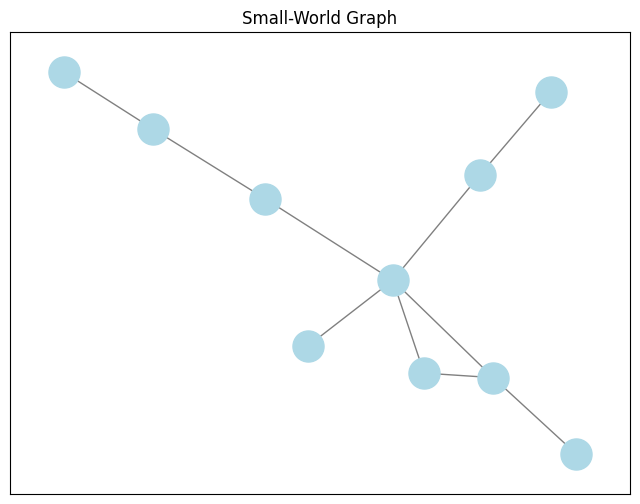

NetworkXError: ignored

<ipython-input-4-6af140ff9733>:13: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  long_range_nodes = random.sample(graph.nodes(), num_long_range)


<Figure size 640x480 with 0 Axes>

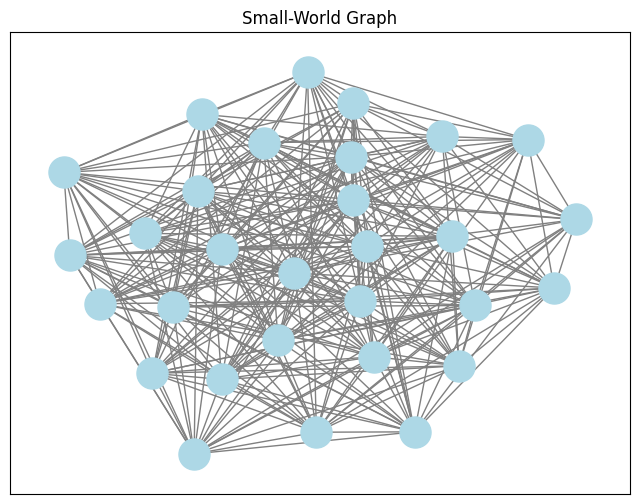

<ipython-input-4-6af140ff9733>:13: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  long_range_nodes = random.sample(graph.nodes(), num_long_range)


<Figure size 640x480 with 0 Axes>

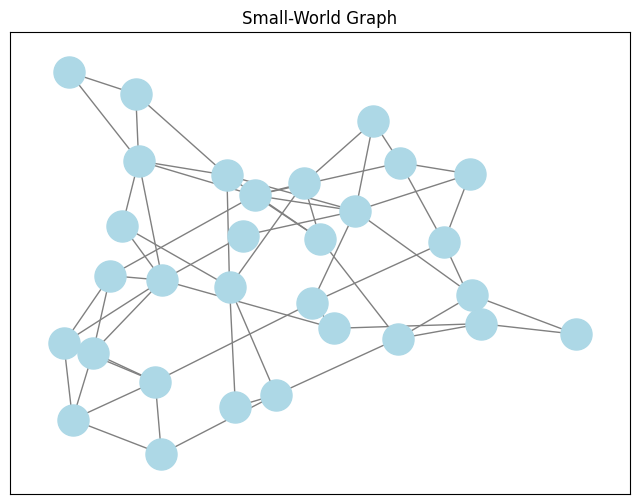

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

def generate_small_world_graph(num_nodes, k_short, k_long, p_rewire, long_range_ratio):
    # Generate a small-world graph
    graph = nx.watts_strogatz_graph(num_nodes, k_short, p_rewire)

    # Create a list of nodes for long-range connections
    num_long_range = int(num_nodes * long_range_ratio)
    long_range_nodes = random.sample(graph.nodes(), num_long_range)

    # Connect each long-range node to its k_long nearest neighbors
    for node in long_range_nodes:
        neighbors = list(graph.neighbors(node))
        random.shuffle(neighbors)

        # Check if the number of neighbors is less than k_long
        if len(neighbors) < k_long:
            k_long_actual = len(neighbors)  # Use the actual number of neighbors
        else:
            k_long_actual = k_long

        for i in range(k_long_actual):
            neighbor = neighbors[i]
            if not graph.has_edge(node, neighbor):
                graph.add_edge(node, neighbor)

    return graph

def visualize_graph(graph):
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(graph)
    nx.draw_networkx(graph, pos, with_labels=False, node_color='lightblue', node_size=500, edge_color='gray')
    plt.title("Small-World Graph")
    plt.show()

def refresh_graph(button):
    # Retrieve the values from the input fields and sliders
    num_nodes = int(input_num_nodes.value)
    k_short = int(input_k_short.value)
    k_long = int(input_k_long.value)
    p_rewire = slider_p_rewire.value
    long_range_ratio = slider_long_range_ratio.value

    # Generate small-world graph based on the input values
    graph = generate_small_world_graph(num_nodes, k_short, k_long, p_rewire, long_range_ratio)

    # Clear the previous graph
    plt.clf()

    # Visualize the graph
    visualize_graph(graph)

# Create input fields for specifying the number of nodes and short-range connections
input_num_nodes = widgets.IntText(description='Number of Nodes:', value=10)
input_k_short = widgets.IntText(description='k (Short Range):', value=2)
input_k_long = widgets.IntText(description='k (Long Range):', value=2)

# Create a slider for controlling the rewiring probability
slider_p_rewire = widgets.FloatSlider(min=0, max=1, step=0.01, description='p (Rewire):', value=0.2)

# Create a slider for adjusting the ratio of long-range to short-range connections
slider_long_range_ratio = widgets.FloatSlider(min=0, max=1, step=0.01, description='Long Range Ratio:', value=0.5)

# Create a refresh button
refresh_button = widgets.Button(description='Refresh')
refresh_button.on_click(refresh_graph)

# Display the widgets
display(input_num_nodes, input_k_short, input_k_long, slider_p_rewire, slider_long_range_ratio, refresh_button)

# Generate and display the initial graph
num_nodes = input_num_nodes.value
k_short = input_k_short.value
k_long = input_k_long.value
p_rewire = slider_p_rewire.value
long_range_ratio = slider_long_range_ratio.value

graph = generate_small_world_graph(num_nodes, k_short, k_long, p_rewire, long_range_ratio)
visualize_graph(graph)


#Random weighted graph pruned according to the weight of the connection divided by square of the distance

* Number of Nodes (num_nodes): This parameter determines the total number of nodes (vertices) in the graph. It represents the size of the network.

* Max Distance (max_distance): This parameter defines the maximum distance between two nodes in the graph. It determines the spatial range within which nodes can be connected.

The construction process of the graph involves the following steps:

1. Random Node Placement: The nodes are randomly placed in a 2-dimensional space. The positions of the nodes are determined by generating random (x, y) coordinates within the specified max distance.

2. Weight Randomization: Each pair of nodes is considered, and if both nodes have valid positions, a random weight is assigned to the connection between the nodes. The weight represents the strength or intensity of the connection.

3. Pruning based on Weight-to-Distance Ratio: For each connection, the weight-to-distance ratio is calculated by dividing the weight of the connection by the square of the distance between the nodes. This ratio indicates the relative strength of the connection with respect to the distance.

Pruning: Connections with weight-to-distance ratios below a certain threshold are pruned, meaning they are removed from the graph. This step helps in sparsifying the network and creating a clustered structure. The threshold determines the minimum relative strength required for a connection to be retained.

The pruning process removes connections with lower weight-to-distance ratios, promoting the retention of stronger connections relative to their distances.

By adjusting the parameters of the number of nodes and the max distance, you can control the size and spatial range of the generated graph. The randomization of weights and pruning based on weight-to-distance ratios provide variability in the strength of connections and their retention, allowing for exploration of different network structures.

IntSlider(value=50, description='Number of Nodes:', min=10, step=10)

FloatSlider(value=5.0, description='Max Distance:', max=10.0, min=1.0, step=0.5)

IntSlider(value=3, description='Initial Connections:', max=10, min=1)

FloatSlider(value=0.2, description='Pruning Threshold:', max=1.0, step=0.01)

FloatSlider(value=0.5, description='Weight Variance:', max=1.0, step=0.01)

Button(description='Refresh', style=ButtonStyle())

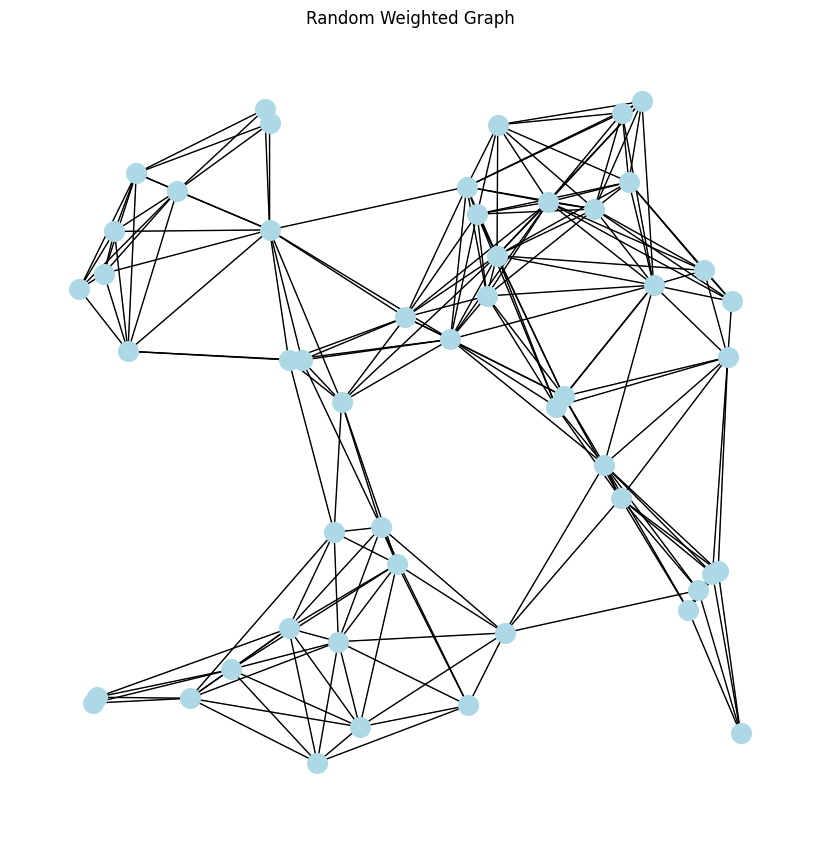

<Figure size 640x480 with 0 Axes>

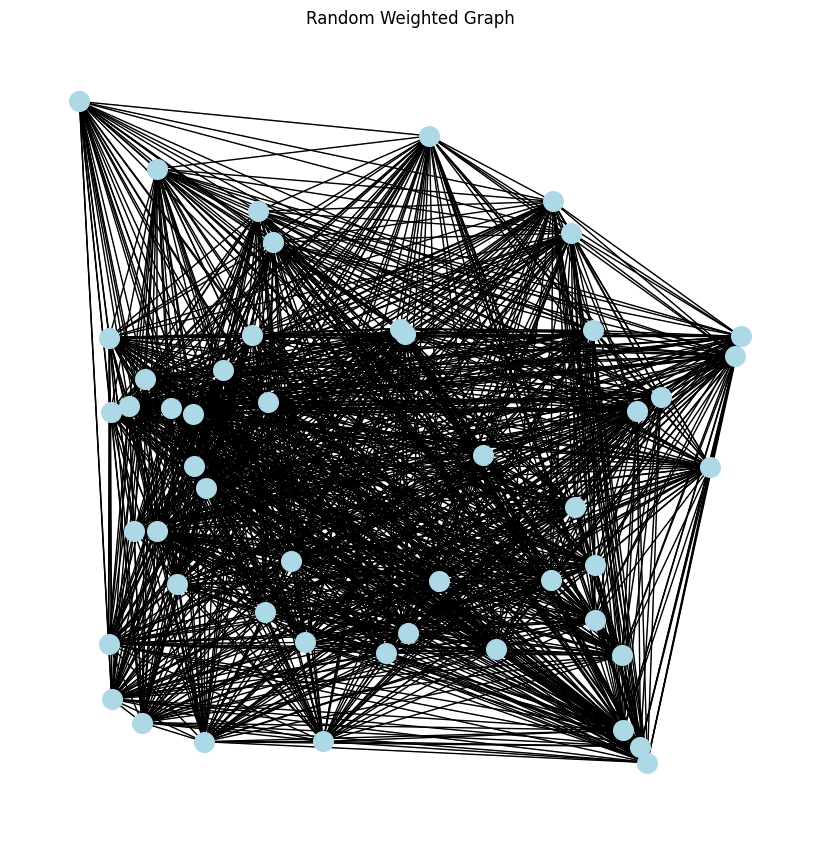

<Figure size 640x480 with 0 Axes>

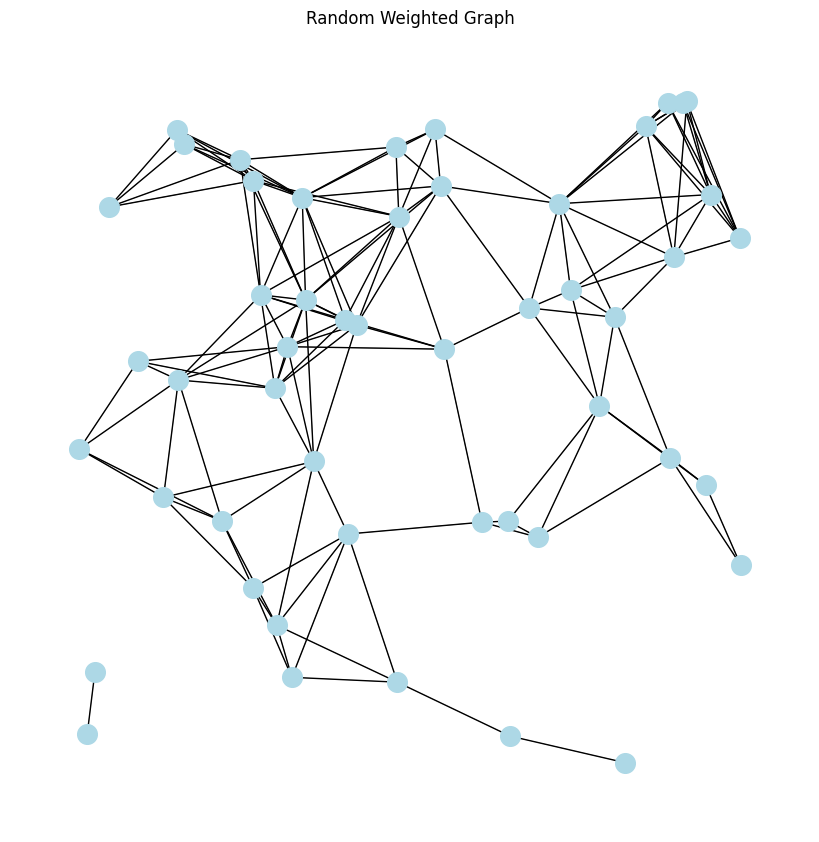

<Figure size 640x480 with 0 Axes>

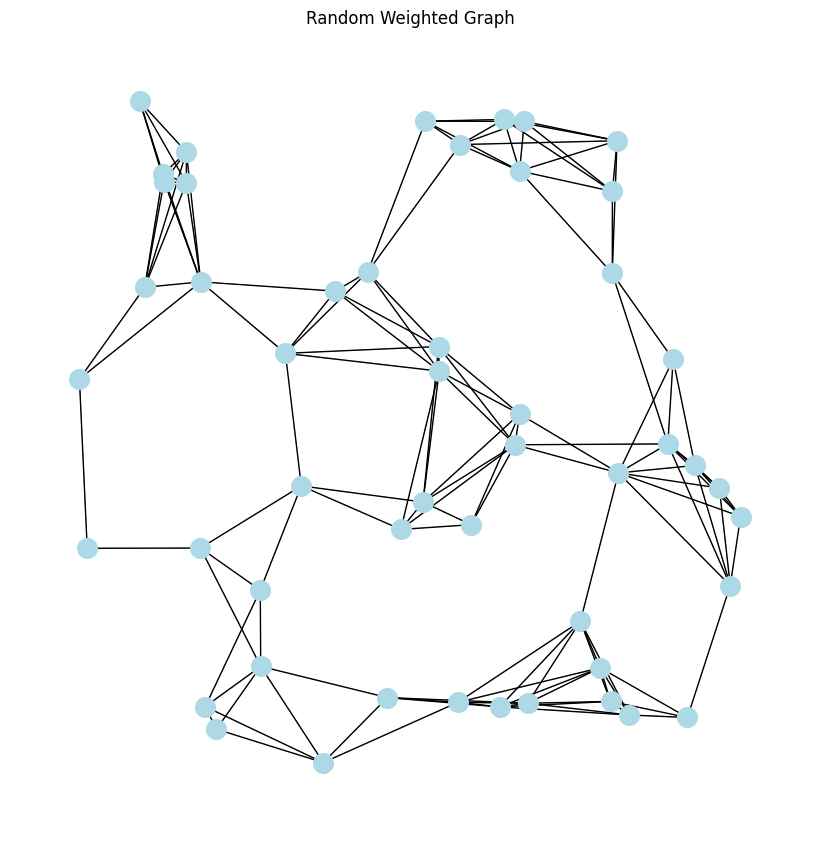

<Figure size 640x480 with 0 Axes>

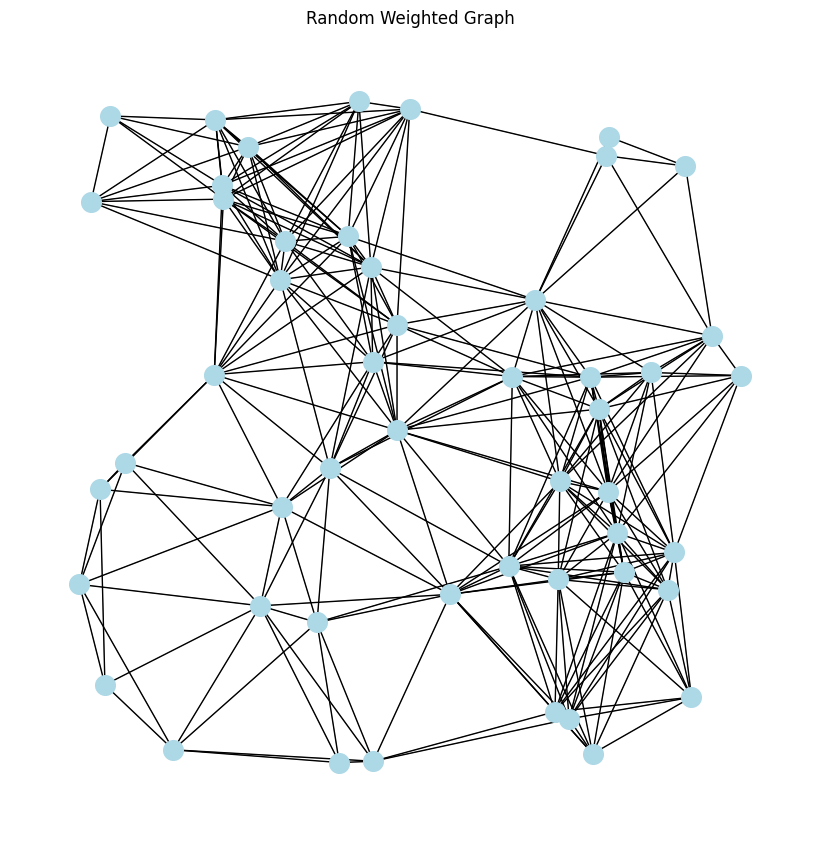

<Figure size 640x480 with 0 Axes>

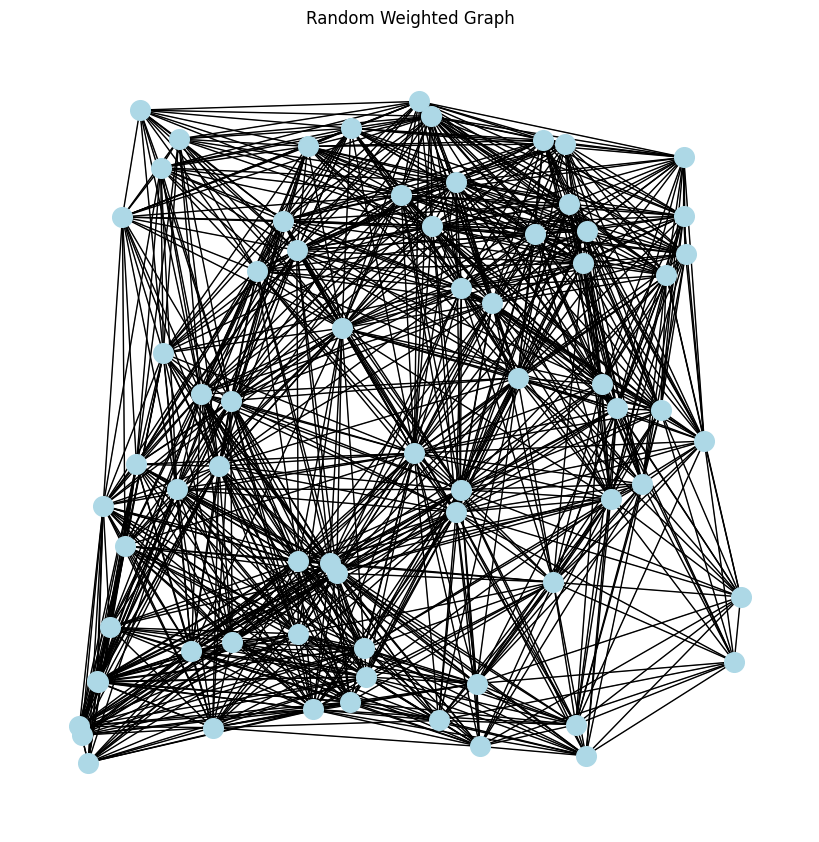

<Figure size 640x480 with 0 Axes>

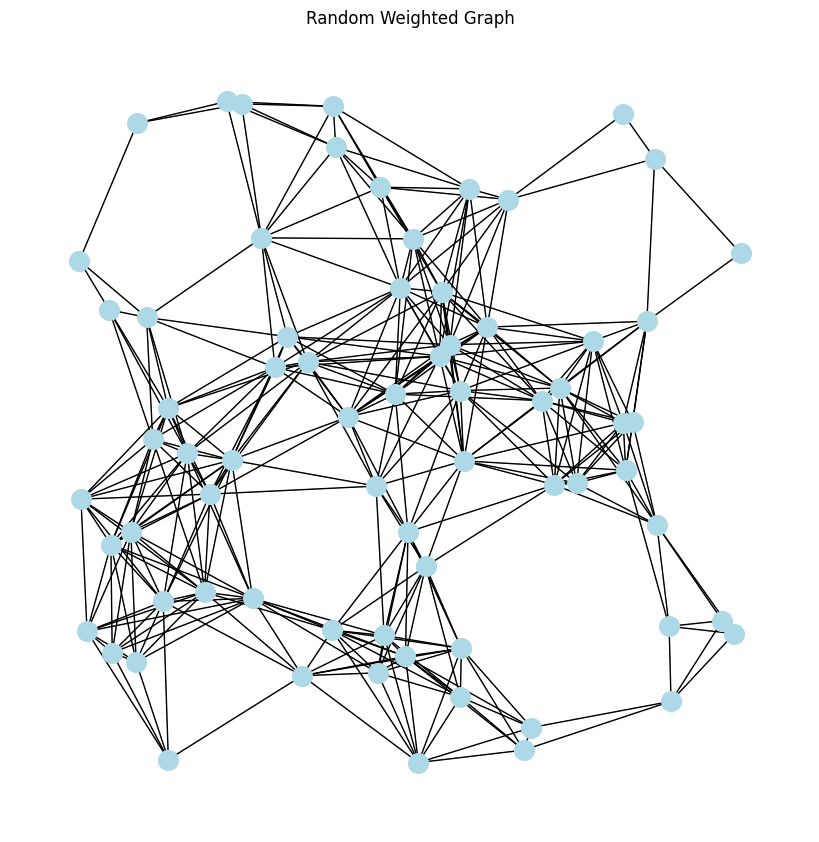

<Figure size 640x480 with 0 Axes>

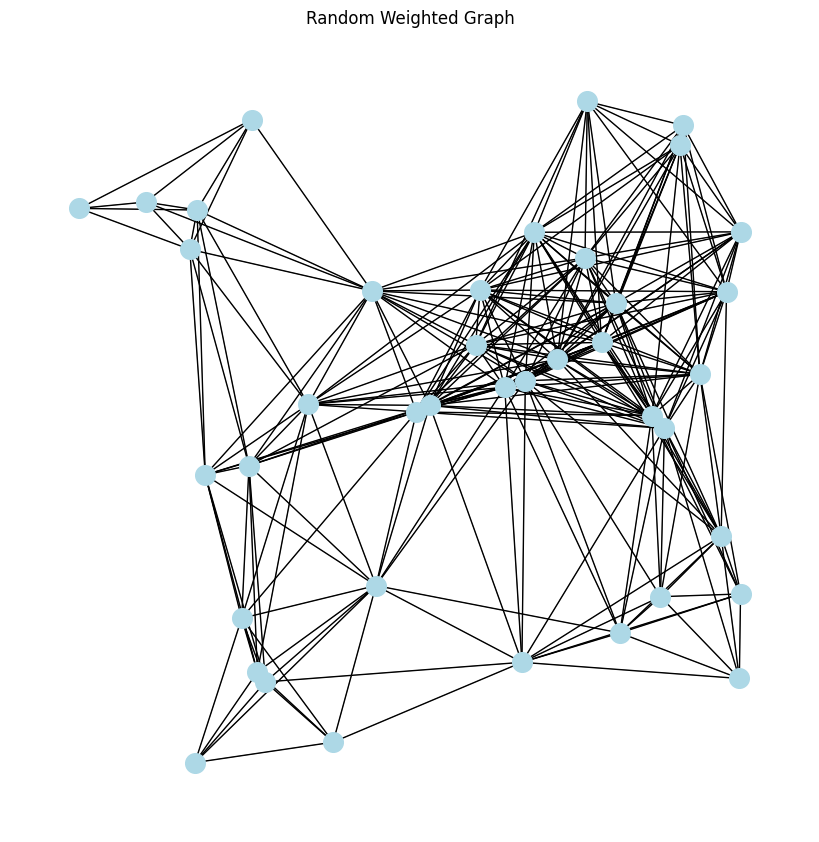

<Figure size 640x480 with 0 Axes>

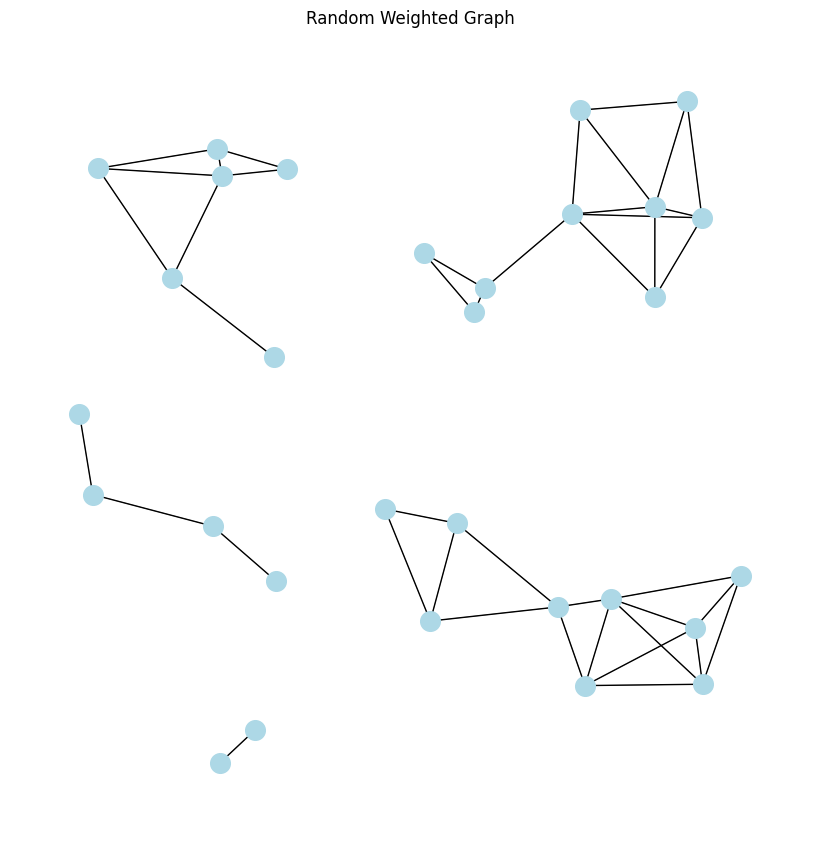

<Figure size 640x480 with 0 Axes>

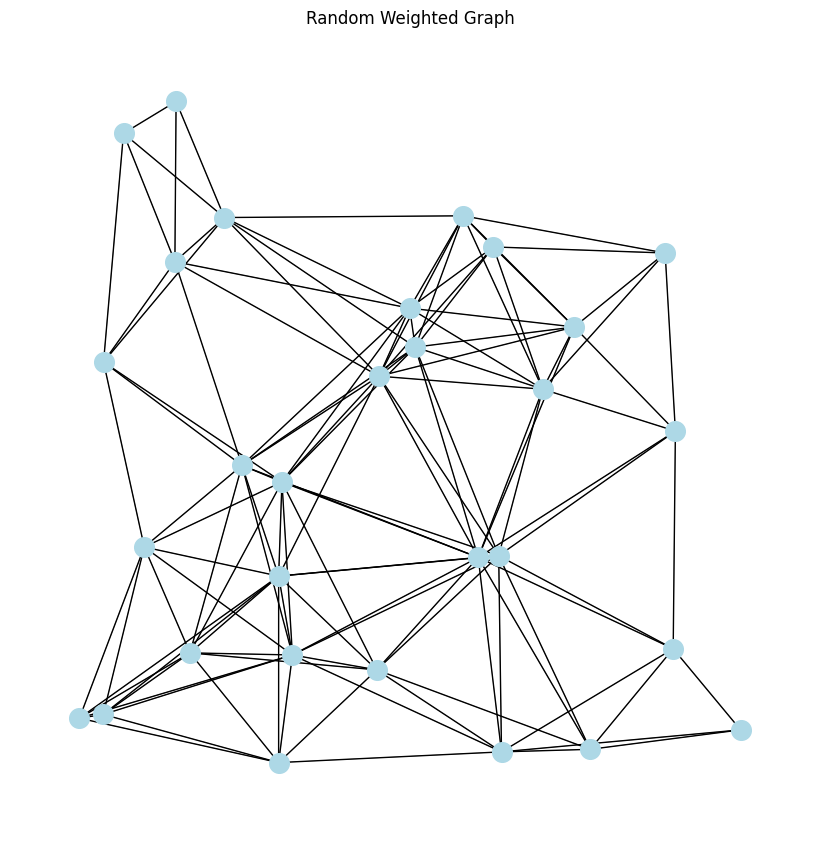

<Figure size 640x480 with 0 Axes>

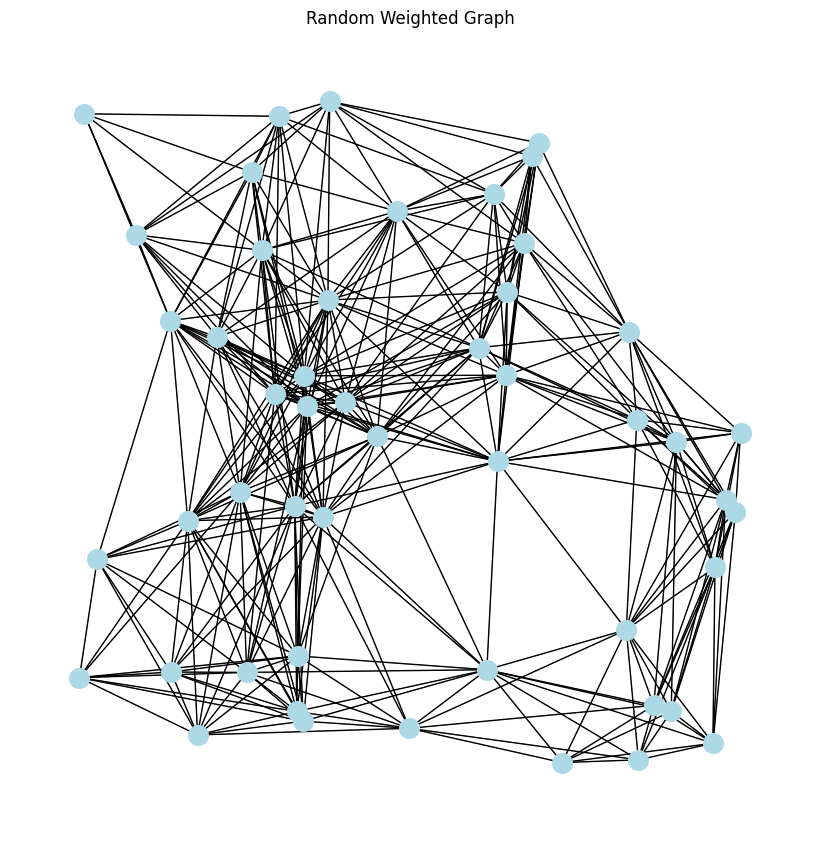

<Figure size 640x480 with 0 Axes>

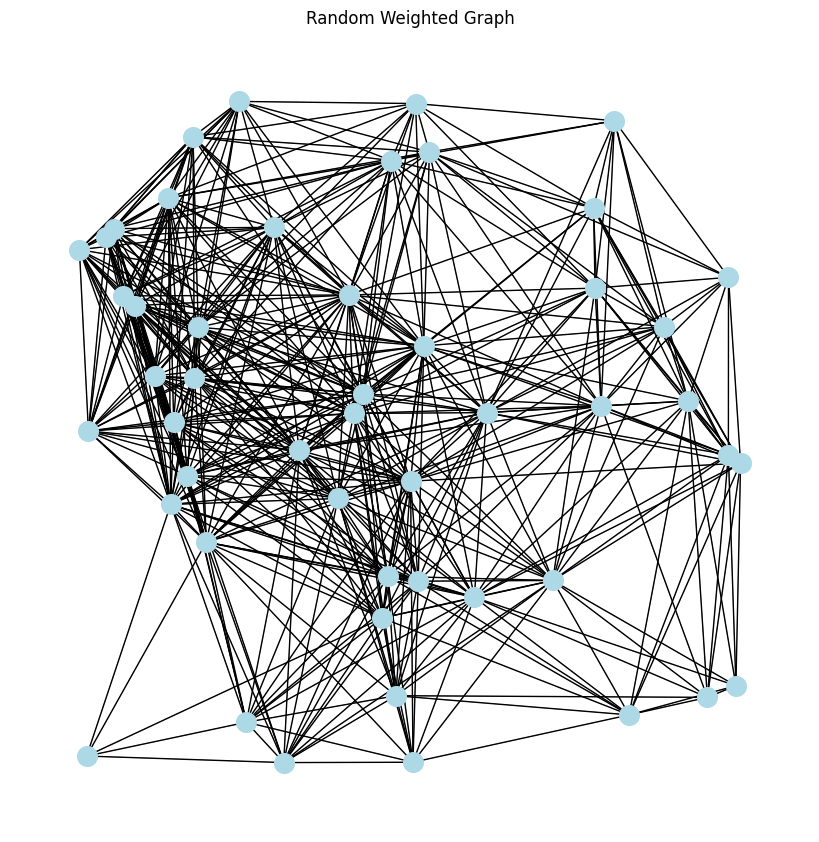

<Figure size 640x480 with 0 Axes>

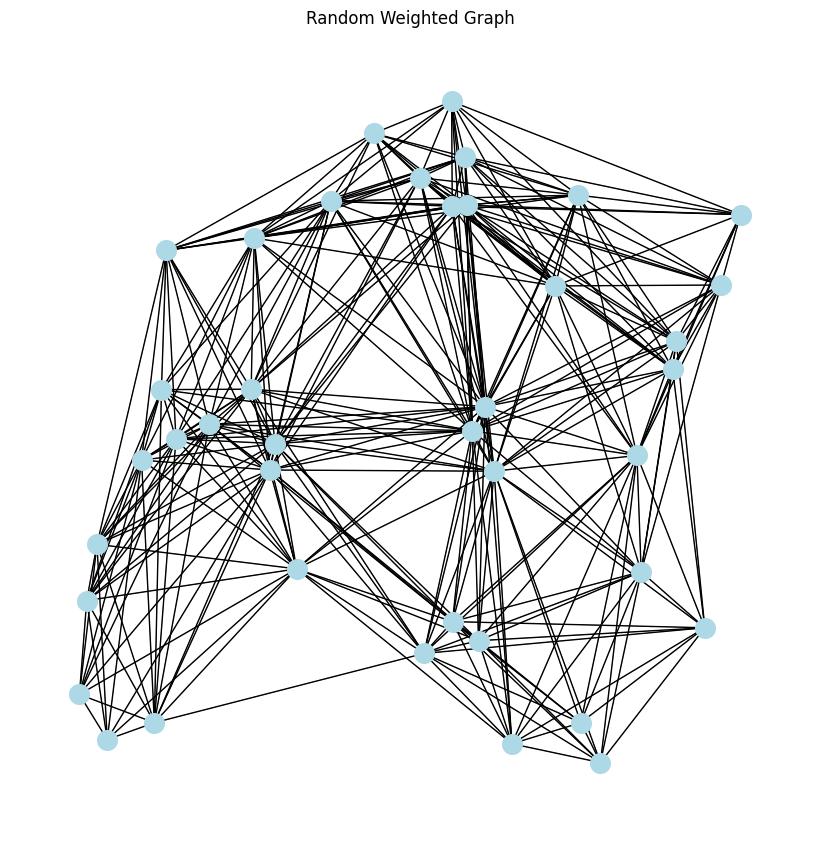

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

def generate_weighted_graph(num_nodes, max_distance, initial_connections, pruning_threshold, weight_variance):
    # Create an empty graph
    graph = nx.Graph()

    # Randomly place nodes in a 2-dimensional space
    for node in range(num_nodes):
        x = random.uniform(0, max_distance)
        y = random.uniform(0, max_distance)
        graph.add_node(node, pos=(x, y))

    # Calculate the maximum distance squared for pruning
    max_distance_squared = max_distance**2

    # Randomize weights between all nodes
    for i in range(num_nodes):
        for j in range(i + 1, num_nodes):
            node1 = graph.nodes[i]
            node2 = graph.nodes[j]
            pos1 = node1['pos']
            pos2 = node2['pos']
            distance_squared = (pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2

            if distance_squared <= max_distance_squared:
                weight = random.uniform(0.5, (weight_variance/2))
                graph.add_edge(i, j, weight=weight)

    # Prune connections based on weight-to-distance ratio
    for edge in graph.edges():
        node1 = graph.nodes[edge[0]]
        node2 = graph.nodes[edge[1]]
        pos1 = node1['pos']
        pos2 = node2['pos']
        distance_squared = (pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2
        weight = graph.edges[edge]['weight']
        weight_distance_ratio = weight / (distance_squared + 1e-10)  # Adding a small value to avoid division by zero

        if weight_distance_ratio < pruning_threshold:
            graph.remove_edge(*edge)

    return graph

def visualize_weighted_graph(graph):
    pos = nx.get_node_attributes(graph, 'pos')
    weights = nx.get_edge_attributes(graph, 'weight').values()

    plt.figure(figsize=(8, 8))
    nx.draw(graph, pos, node_color='lightblue', node_size=200, with_labels=False)
    nx.draw_networkx_edges(graph, pos, alpha=0.5, width=list(weights), edge_color='black')
    plt.title('Random Weighted Graph')
    plt.axis('off')
    plt.show()


def refresh_graph(button):
    # Retrieve the values from the sliders
    num_nodes = num_nodes_slider.value
    max_distance = max_distance_slider.value
    initial_connections = initial_connections_slider.value
    pruning_threshold = pruning_threshold_slider.value
    weight_variance = weight_variance_slider.value

    # Generate the weighted graph based on the slider values
    weighted_graph = generate_weighted_graph(num_nodes, max_distance, initial_connections, pruning_threshold, weight_variance)

    # Clear the previous graph
    plt.clf()

    # Visualize the weighted graph
    visualize_weighted_graph(weighted_graph)


# Create sliders for setting the parameters
num_nodes_slider = widgets.IntSlider(min=10, max=100, step=10, description='Number of Nodes:', value=50)
max_distance_slider = widgets.FloatSlider(min=1, max=10, step=0.5, description='Max Distance:', value=5)
initial_connections_slider = widgets.IntSlider(min=1, max=10, step=1, description='Initial Connections:', value=3)
pruning_threshold_slider = widgets.FloatSlider(min=0, max=1, step=0.01, description='Pruning Threshold:', value=0.2)
weight_variance_slider = widgets.FloatSlider(min=0, max=1, step=0.01, description='Weight Variance:', value=0.5)

# Create a refresh button
refresh_button = widgets.Button(description='Refresh')
refresh_button.on_click(refresh_graph)

# Display the sliders and button
display(num_nodes_slider, max_distance_slider, initial_connections_slider, pruning_threshold_slider, weight_variance_slider, refresh_button)

# Generate and display the initial weighted graph
weighted_graph = generate_weighted_graph(num_nodes_slider.value, max_distance_slider.value, initial_connections_slider.value, pruning_threshold_slider.value, weight_variance_slider.value)
visualize_weighted_graph(weighted_graph)


Above but with weights indicate by colour (currently broken)

IntSlider(value=50, description='Number of Nodes:', min=10, step=10)

FloatSlider(value=5.0, description='Max Distance:', max=10.0, min=1.0, step=0.5)

IntSlider(value=3, description='Initial Connections:', max=10, min=1)

FloatSlider(value=0.2, description='Pruning Threshold:', max=1.0, step=0.01)

FloatSlider(value=0.5, description='Weight Variance:', max=1.0, step=0.01)

Button(description='Refresh', style=ButtonStyle())

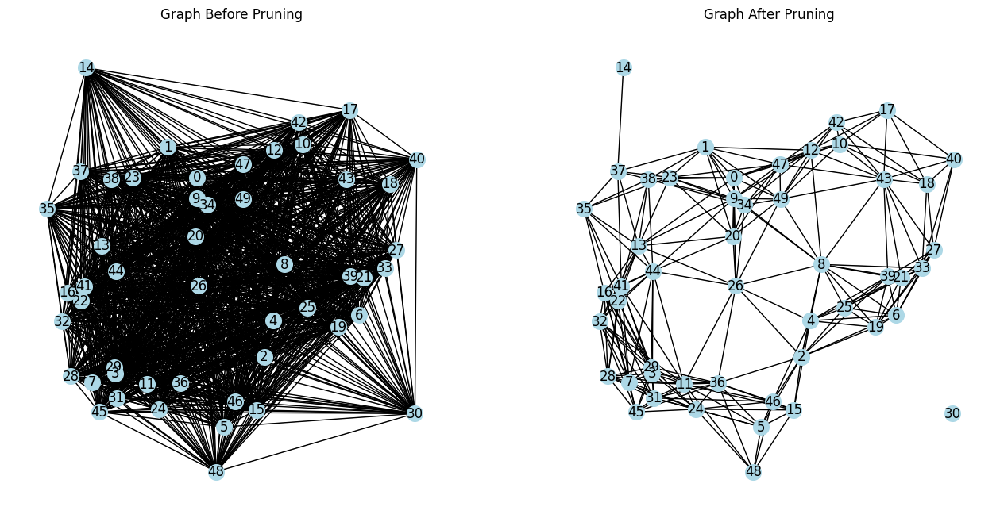

<Figure size 640x480 with 0 Axes>

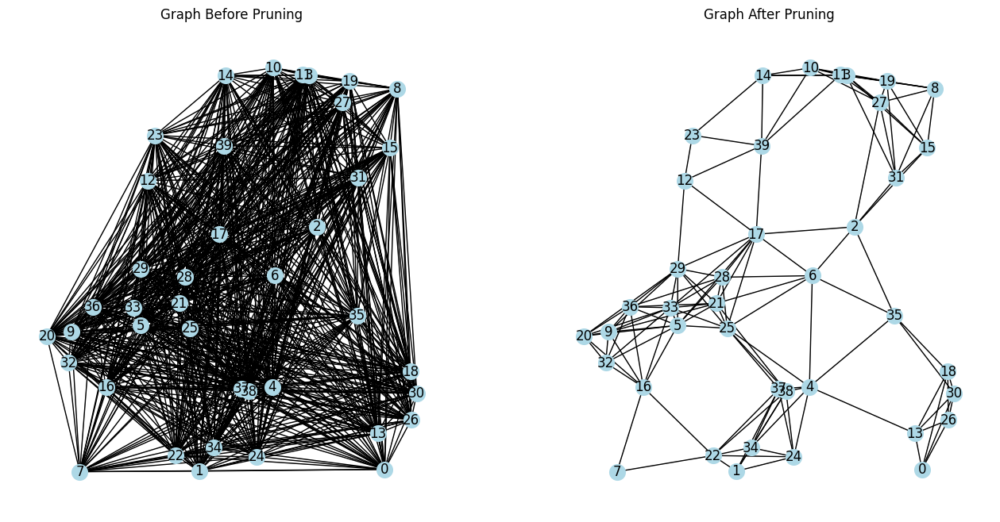

<Figure size 640x480 with 0 Axes>

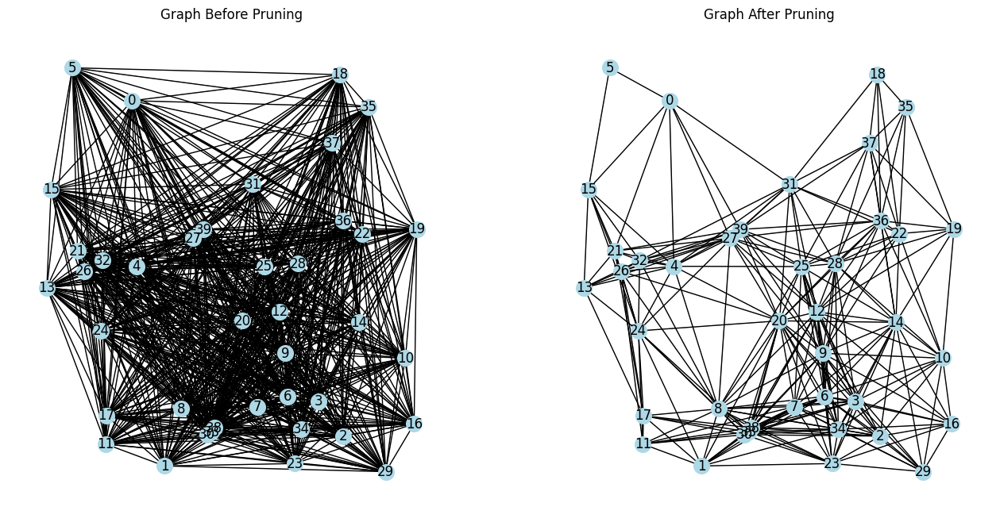

<Figure size 640x480 with 0 Axes>

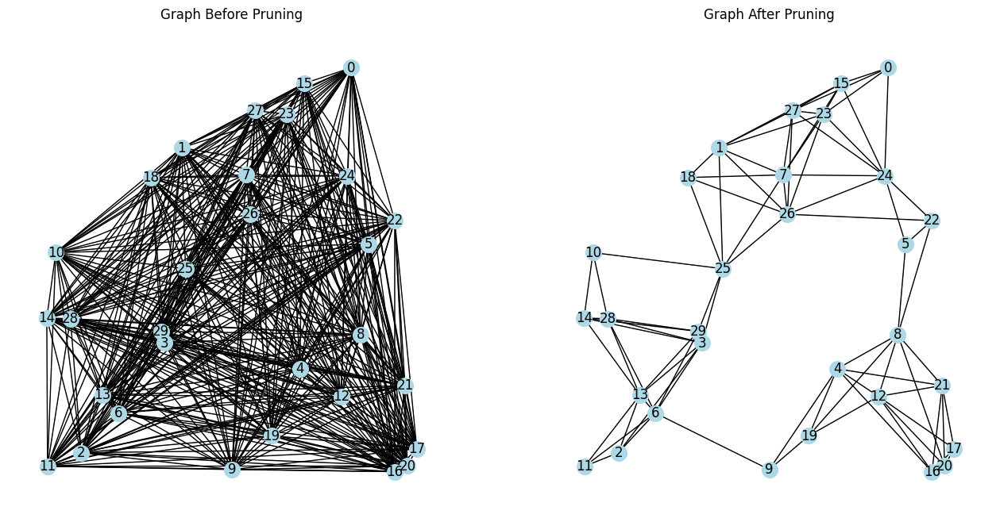

<Figure size 640x480 with 0 Axes>

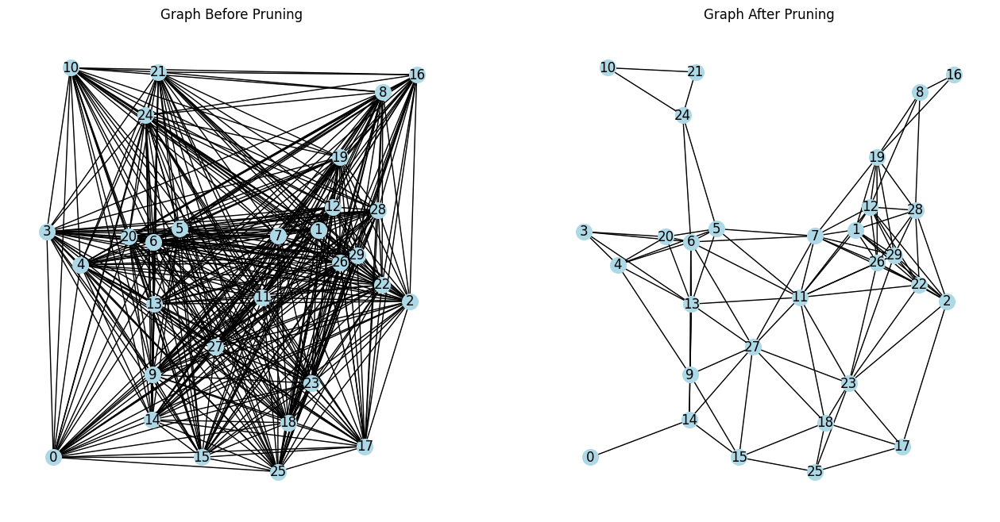

<Figure size 640x480 with 0 Axes>

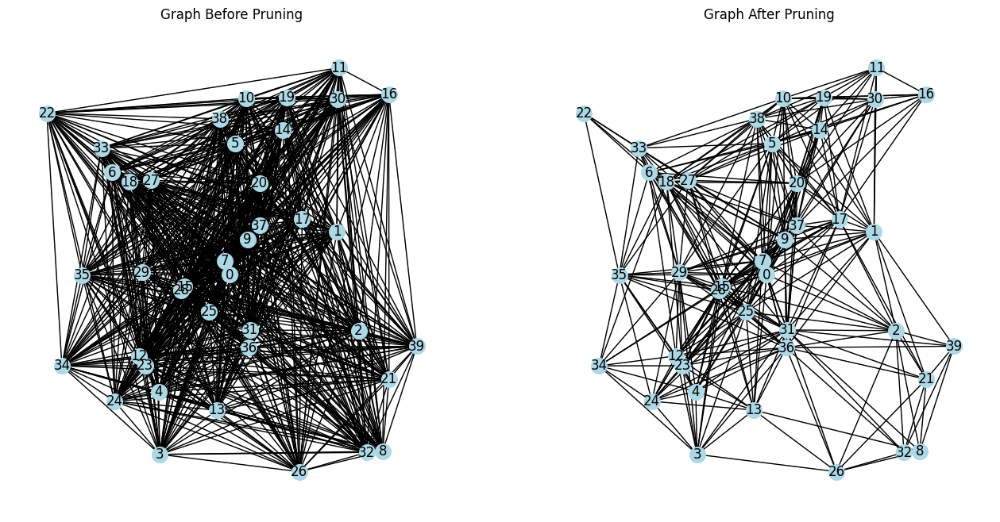

<Figure size 640x480 with 0 Axes>

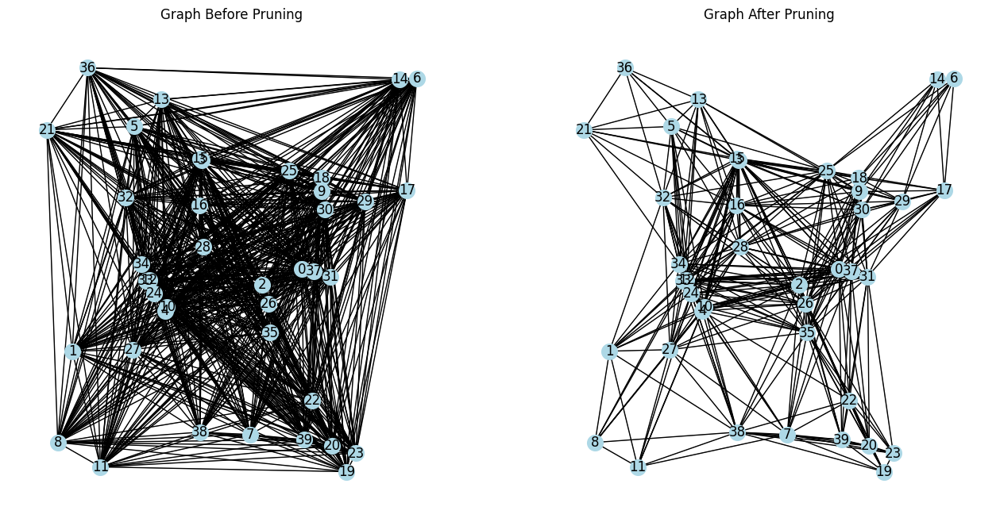

<Figure size 640x480 with 0 Axes>

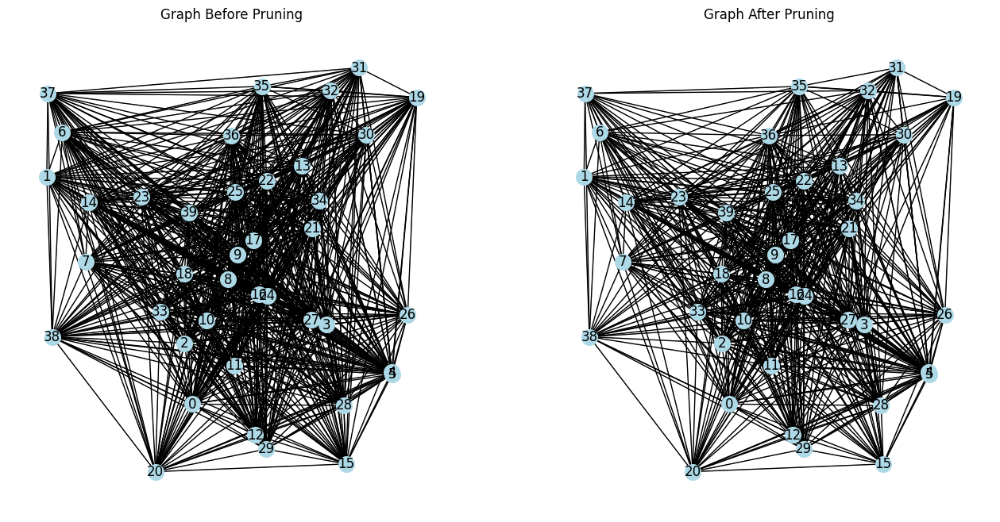

<Figure size 640x480 with 0 Axes>

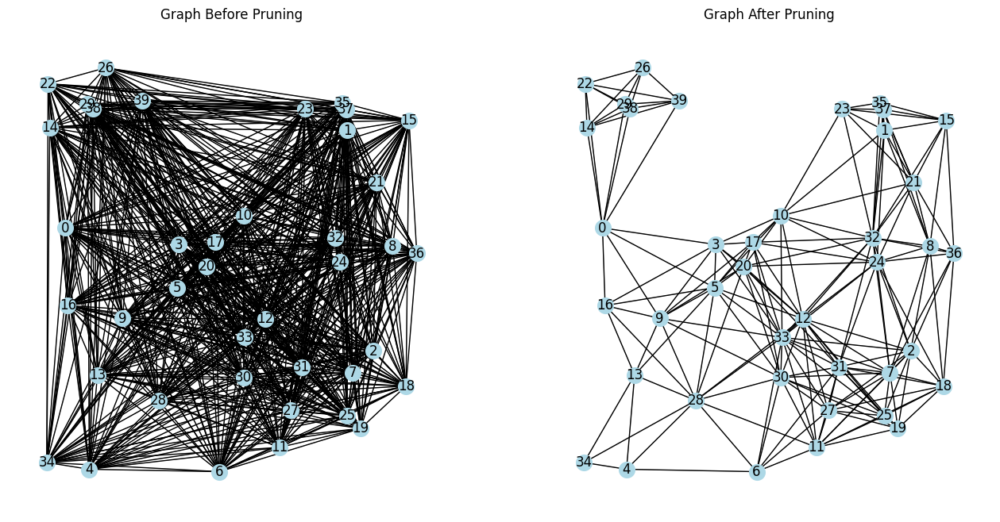

<Figure size 640x480 with 0 Axes>

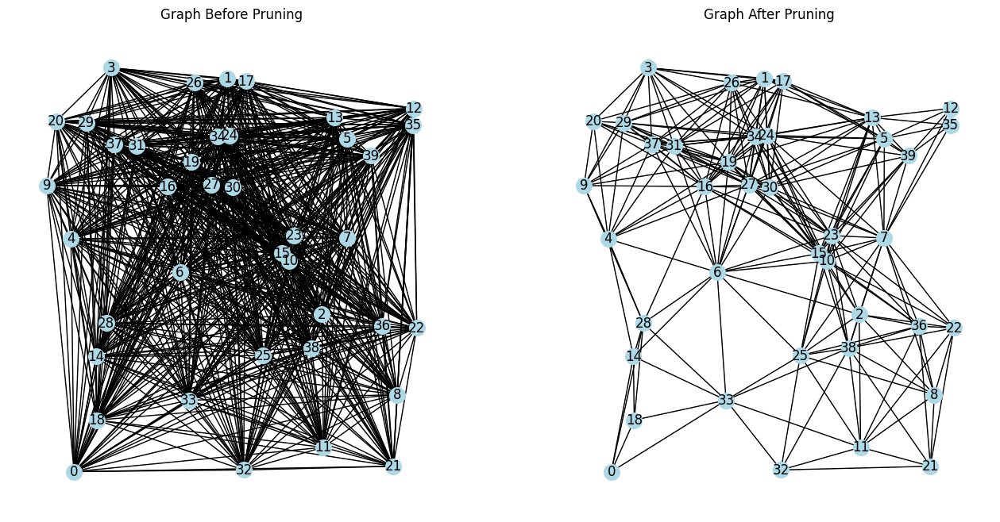

<Figure size 640x480 with 0 Axes>

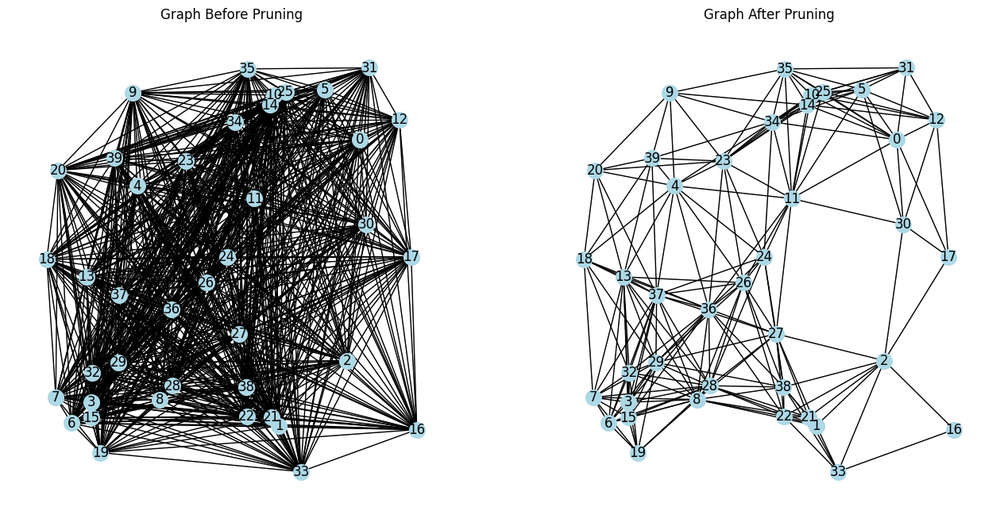

<Figure size 640x480 with 0 Axes>

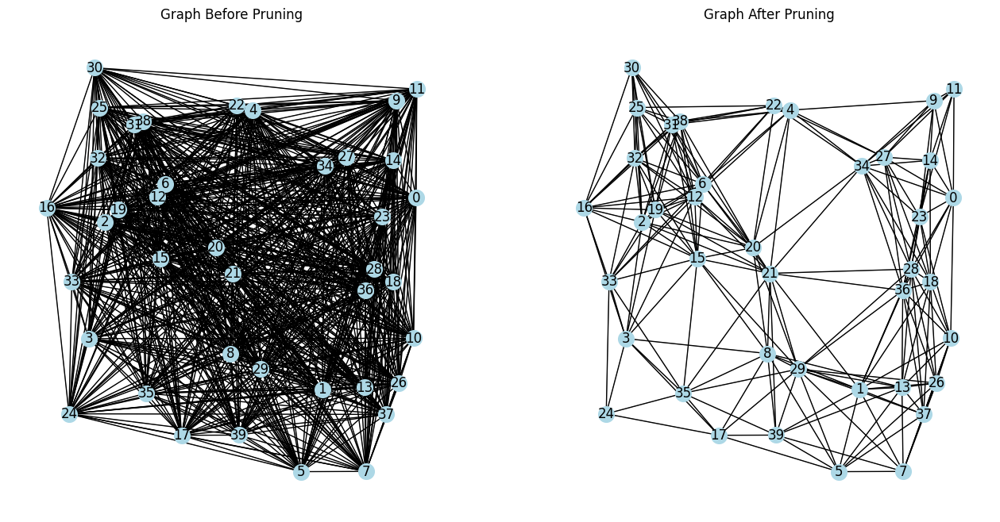

<Figure size 640x480 with 0 Axes>

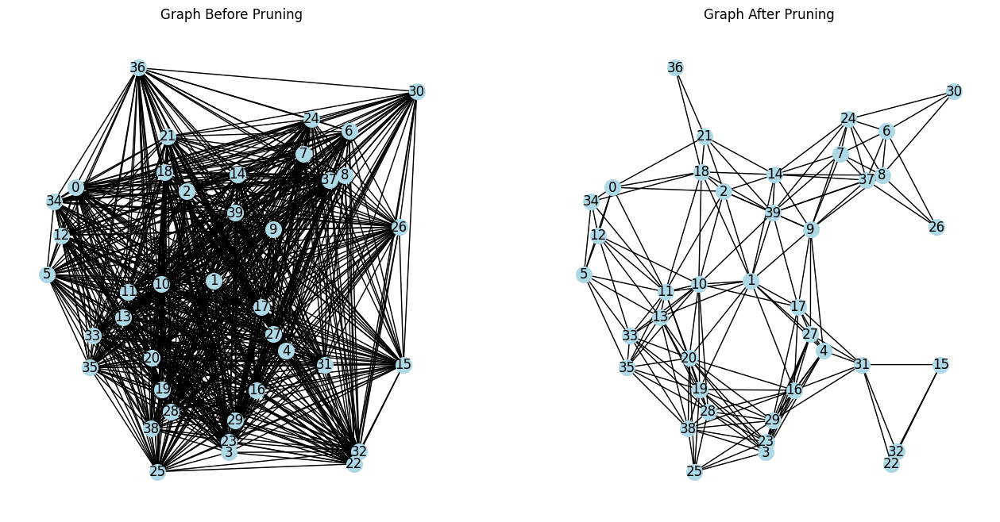

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

def generate_weighted_graph(num_nodes, max_distance, initial_connections, pruning_threshold, weight_variance):
    # Create an empty graph
    graph = nx.Graph()

    # Randomly place nodes in a 2-dimensional space
    for node in range(num_nodes):
        x = random.uniform(0, max_distance)
        y = random.uniform(0, max_distance)
        graph.add_node(node, pos=(x, y))

    # Calculate the maximum distance squared for pruning
    max_distance_squared = max_distance**2

    # Randomize weights between all nodes
    for i in range(num_nodes):
        for j in range(i + 1, num_nodes):
            node1 = graph.nodes[i]
            node2 = graph.nodes[j]
            pos1 = node1['pos']
            pos2 = node2['pos']
            distance_squared = (pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2

            if distance_squared <= max_distance_squared:
                weight = random.uniform(0.5, (weight_variance/2))
                graph.add_edge(i, j, weight=weight)

    # Copy the graph before pruning
    graph_before_pruning = graph.copy()

    # Prune connections based on weight-to-distance ratio
    for edge in list(graph.edges()):
        node1 = graph.nodes[edge[0]]
        node2 = graph.nodes[edge[1]]
        pos1 = node1['pos']
        pos2 = node2['pos']
        distance_squared = (pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2
        weight = graph.edges[edge]['weight']
        weight_distance_ratio = weight / (distance_squared + 1e-10)  # Adding a small value to avoid division by zero

        if weight_distance_ratio < pruning_threshold:
            graph.remove_edge(*edge)

    return graph_before_pruning, graph

def visualize_weighted_graph(graph_before_pruning, graph_after_pruning):
    pos_before = nx.get_node_attributes(graph_before_pruning, 'pos')
    weights_before = nx.get_edge_attributes(graph_before_pruning, 'weight').values()

    pos_after = nx.get_node_attributes(graph_after_pruning, 'pos')
    weights_after = nx.get_edge_attributes(graph_after_pruning, 'weight').values()

    plt.figure(figsize=(16, 8))

    plt.subplot(121)
    nx.draw(graph_before_pruning, pos_before, node_color='lightblue', node_size=200, with_labels=True)
    nx.draw_networkx_edges(graph_before_pruning, pos_before, alpha=0.5, width=list(weights_before), edge_color='black')
    plt.title('Graph Before Pruning')
    plt.axis('off')

    plt.subplot(122)
    nx.draw(graph_after_pruning, pos_after, node_color='lightblue', node_size=200, with_labels=True)
    nx.draw_networkx_edges(graph_after_pruning, pos_after, alpha=0.5, width=list(weights_after), edge_color='black')
    plt.title('Graph After Pruning')
    plt.axis('off')

    plt.show()


def refresh_graph(button):
    # Retrieve the values from the sliders
    num_nodes = num_nodes_slider.value
    max_distance = max_distance_slider.value
    initial_connections = initial_connections_slider.value
    pruning_threshold = pruning_threshold_slider.value
    weight_variance = weight_variance_slider.value

    # Generate the weighted graphs (before and after pruning) based on the slider values
    graph_before_pruning, graph_after_pruning = generate_weighted_graph(
        num_nodes, max_distance, initial_connections, pruning_threshold, weight_variance)

    # Clear the previous graph
    plt.clf()

    # Visualize the weighted graphs
    visualize_weighted_graph(graph_before_pruning, graph_after_pruning)


# Create sliders for setting the parameters
num_nodes_slider = widgets.IntSlider(min=10, max=100, step=10, description='Number of Nodes:', value=50)
max_distance_slider = widgets.FloatSlider(min=1, max=10, step=0.5, description='Max Distance:', value=5)
initial_connections_slider = widgets.IntSlider(min=1, max=10, step=1, description='Initial Connections:', value=3)
pruning_threshold_slider = widgets.FloatSlider(min=0, max=1, step=0.01, description='Pruning Threshold:', value=0.2)
weight_variance_slider = widgets.FloatSlider(min=0, max=1, step=0.01, description='Weight Variance:', value=0.5)

# Create a refresh button
refresh_button = widgets.Button(description='Refresh')
refresh_button.on_click(refresh_graph)

# Display the sliders and button
display(num_nodes_slider, max_distance_slider, initial_connections_slider, pruning_threshold_slider, weight_variance_slider, refresh_button)

# Generate and display the initial weighted graphs
graph_before_pruning, graph_after_pruning = generate_weighted_graph(
    num_nodes_slider.value, max_distance_slider.value, initial_connections_slider.value, pruning_threshold_slider.value, weight_variance_slider.value)
visualize_weighted_graph(graph_before_pruning, graph_after_pruning)


preseving old code incase I break something

IntSlider(value=50, description='Number of Nodes:', min=10, step=10)

FloatSlider(value=5.0, description='Max Distance:', max=10.0, min=1.0, step=0.5)

IntSlider(value=3, description='Initial Connections:', max=10, min=1)

FloatSlider(value=0.2, description='Pruning Threshold:', max=1.0, step=0.01)

FloatSlider(value=0.5, description='Weight Variance:', max=1.0, step=0.01)

Button(description='Refresh', style=ButtonStyle())

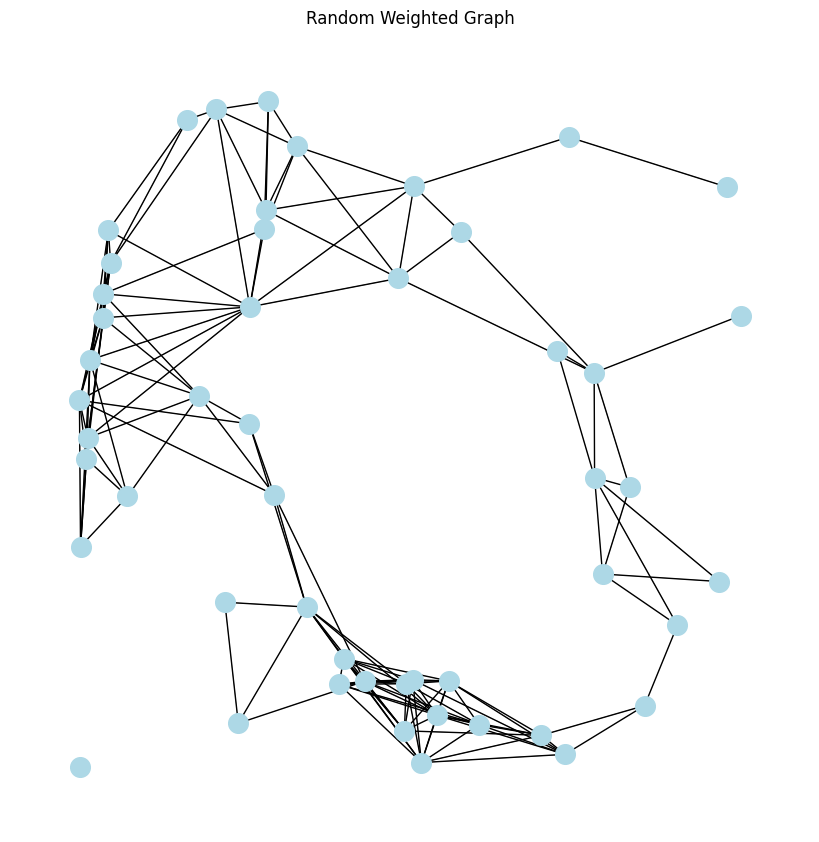

<Figure size 640x480 with 0 Axes>

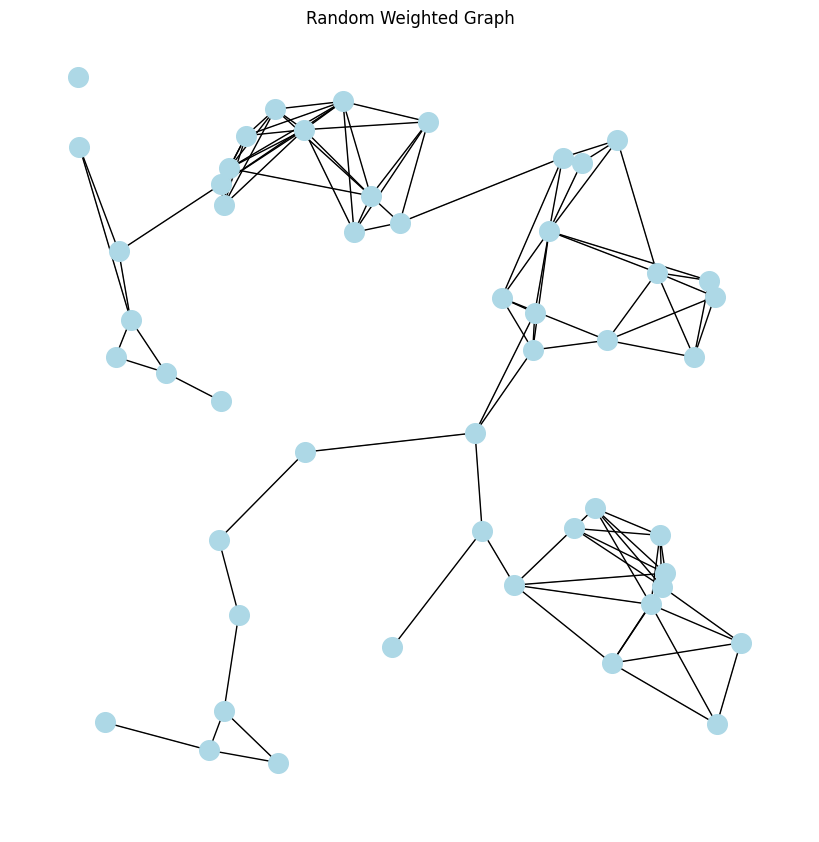

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

def generate_weighted_graph(num_nodes, max_distance, initial_connections, pruning_threshold, weight_variance):
    # Create an empty graph
    graph = nx.Graph()

    # Randomly place nodes in a 2-dimensional space
    for node in range(num_nodes):
        x = random.uniform(0, max_distance)
        y = random.uniform(0, max_distance)
        graph.add_node(node, pos=(x, y))

    # Calculate the maximum distance squared for pruning
    max_distance_squared = max_distance**2

    # Randomize weights between all nodes
    for i in range(num_nodes):
        for j in range(i + 1, num_nodes):
            node1 = graph.nodes[i]
            node2 = graph.nodes[j]
            pos1 = node1['pos']
            pos2 = node2['pos']
            distance_squared = (pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2

            if distance_squared <= max_distance_squared:
                weight = random.uniform(0, weight_variance)
                graph.add_edge(i, j, weight=weight)

    # Prune connections based on weight-to-distance ratio
    for edge in graph.edges():
        node1 = graph.nodes[edge[0]]
        node2 = graph.nodes[edge[1]]
        pos1 = node1['pos']
        pos2 = node2['pos']
        distance_squared = (pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2
        weight = graph.edges[edge]['weight']
        weight_distance_ratio = weight / (distance_squared + 1e-10)  # Adding a small value to avoid division by zero

        if weight_distance_ratio < pruning_threshold:
            graph.remove_edge(*edge)

    return graph

def visualize_weighted_graph(graph):
    pos = nx.get_node_attributes(graph, 'pos')
    weights = nx.get_edge_attributes(graph, 'weight').values()

    plt.figure(figsize=(8, 8))
    nx.draw(graph, pos, node_color='lightblue', node_size=200, with_labels=False)
    nx.draw_networkx_edges(graph, pos, alpha=0.5, width=list(weights), edge_color='black')
    plt.title('Random Weighted Graph')
    plt.axis('off')
    plt.show()


def refresh_graph(button):
    # Retrieve the values from the sliders
    num_nodes = num_nodes_slider.value
    max_distance = max_distance_slider.value
    initial_connections = initial_connections_slider.value
    pruning_threshold = pruning_threshold_slider.value
    weight_variance = weight_variance_slider.value

    # Generate the weighted graph based on the slider values
    weighted_graph = generate_weighted_graph(num_nodes, max_distance, initial_connections, pruning_threshold, weight_variance)

    # Clear the previous graph
    plt.clf()

    # Visualize the weighted graph
    visualize_weighted_graph(weighted_graph)


# Create sliders for setting the parameters
num_nodes_slider = widgets.IntSlider(min=10, max=100, step=10, description='Number of Nodes:', value=50)
max_distance_slider = widgets.FloatSlider(min=1, max=10, step=0.5, description='Max Distance:', value=5)
initial_connections_slider = widgets.IntSlider(min=1, max=10, step=1, description='Initial Connections:', value=3)
pruning_threshold_slider = widgets.FloatSlider(min=0, max=1, step=0.01, description='Pruning Threshold:', value=0.2)
weight_variance_slider = widgets.FloatSlider(min=0, max=1, step=0.01, description='Weight Variance:', value=0.5)

# Create a refresh button
refresh_button = widgets.Button(description='Refresh')
refresh_button.on_click(refresh_graph)

# Display the sliders and button
display(num_nodes_slider, max_distance_slider, initial_connections_slider, pruning_threshold_slider, weight_variance_slider, refresh_button)

# Generate and display the initial weighted graph
weighted_graph = generate_weighted_graph(num_nodes_slider.value, max_distance_slider.value, initial_connections_slider.value, pruning_threshold_slider.value, weight_variance_slider.value)
visualize_weighted_graph(weighted_graph)
